# Week 19 - Progress Log

I have **290 food webs**, each with `Nodes`, `Edges`, and `Connectance`. To cluster them into **small, medium, and large** based on the number of **Edges (links)** (which makes sense computationally), here's a recommended academic approach:

---

## ✅ **Step 1: Define Size Categories by Edges**

A **quantile-based partitioning** gives a fair distribution and is statistically justified for heterogeneously sized datasets.

### Option A: Use **Quantiles (tertiles)**

```text
Small:        bottom 33% (low edge count)
Medium:       middle 33%
Large:        top 33% (high edge count)
```

### Option B: Define **custom edge thresholds**

Based on ecological logic or runtime performance:

```text
Small:        Edges ≤ 500
Medium:       500 < Edges ≤ 3000
Large:        Edges > 3000
```

I recommend starting with **Option A (tertiles)** to see how the data distributes naturally. Then we can refine.

---

In [35]:
import pandas as pd

# Reload the uploaded CSV
file_path = "../../data/processed/foodweb_metrics.csv"
df = pd.read_csv(file_path)

# Calculate tertiles based on the 'Edges' column
tertile_1 = df['Edges'].quantile(1/3)
tertile_2 = df['Edges'].quantile(2/3)

# Define categories
def categorize_edges(edges):
    if edges <= tertile_1:
        return 'small'
    elif edges <= tertile_2:
        return 'medium'
    else:
        return 'large'

# Apply categorization
df['SizeCategory'] = df['Edges'].apply(categorize_edges)

# Split into separate DataFrames
df_small = df[df['SizeCategory'] == 'small']
df_medium = df[df['SizeCategory'] == 'medium']
df_large = df[df['SizeCategory'] == 'large']

# Save to CSV files
small_path = "../../data/processed/small_tertile_foodwebs_16-120.csv"
medium_path = "../../data/processed/medium_tertile_foodwebs_121-417.csv"
large_path = "../../data/processed/large_tertile_foodwebs_418-16041.csv"

df_small.to_csv(small_path, index=False)
df_medium.to_csv(medium_path, index=False)
df_large.to_csv(large_path, index=False)

print("Total amount of Foodwebs:")
print(df_small["Edges"].count() + df_medium["Edges"].count() + df_large["Edges"].count())

Total amount of Foodwebs:
290


The dataset has been successfully split into **tertiles** based on the number of edges (links), and stored in the following CSV files:

* [small\_webs.csv](sandbox:/mnt/data/small_webs.csv)
* [medium\_webs.csv](sandbox:/mnt/data/medium_webs.csv)
* [large\_webs.csv](sandbox:/mnt/data/large_webs.csv)

In [46]:
# Re-import modules after code execution state reset
import pandas as pd
import numpy as np

# Reload the dataset
file_path = "../../data/processed/foodweb_metrics.csv"
df = pd.read_csv(file_path)

# Recompute tertiles
tertile_1 = df['Edges'].quantile(1/3)
tertile_2 = df['Edges'].quantile(2/3)

# Re-categorize by edge count
def categorize_edges(edges):
    if edges <= tertile_1:
        return 'small'
    elif edges <= tertile_2:
        return 'medium'
    else:
        return 'large'

df['SizeCategory'] = df['Edges'].apply(categorize_edges)

# Split categories
df_small = df[df['SizeCategory'] == 'small']
df_medium = df[df['SizeCategory'] == 'medium']
df_large = df[df['SizeCategory'] == 'large']

# Sample from each category
np.random.seed(42)
sampled_small = df_small.sample(n=min(10, len(df_small)), random_state=42)
sampled_medium = df_medium.sample(n=min(10, len(df_medium)), random_state=42)
sampled_large = df_large.sample(n=min(10, len(df_large)), random_state=42)

# Combine and save
sampled_combined = pd.concat([sampled_small, sampled_medium, sampled_large]).reset_index(drop=True)
sampled_path = "../../data/processed/stratified_random_sampled_foodwebs.csv"
sampled_combined.to_csv(sampled_path, index=False)

sampled_combined

,Foodweb,Nodes,Edges,Connectance,SizeCategory
0,PGUBP3,21,68,0.161905,small
1,CGP1,18,27,0.088235,small
2,SF2M2,15,30,0.142857,small
3,Twin Lake East,13,17,0.108974,small
4,SF1I2,20,58,0.152632,small
5,SF1I4,21,80,0.190476,small
6,PP1I1,27,119,0.169516,small
7,CGP3,31,103,0.110753,small
8,Indian Lake,35,102,0.085714,small
9,Brook trout lake,15,19,0.090476,small


Here is the final sample of food webs—10 from each size category (small, medium, large)—stored in one CSV:

* [sampled\_foodwebs.csv](sandbox:/mnt/data/sampled_foodwebs.csv)

This subset is ideal for testing generalization without processing the full dataset.

In [2]:
# Code to generate .mat files from the sampled food webs with mass data in ascending order

import os
import pandas as pd
import numpy as np
from scipy.sparse import csc_matrix
from scipy.io import savemat

df = pd.read_csv("../../data/processed/stratified_random_sampled_foodwebs.csv")
foodweb_filenames = df['Foodweb'].unique()

input_dir = "../../data/processed/foodwebs_csv"
output_dir = "../../data/processed/foodwebs_mat_by_ecosystem/MAT_mass"
os.makedirs(output_dir, exist_ok=True)

failed_files = []

for filename in foodweb_filenames:
    filename = filename.strip()
    if not filename.endswith(".csv"):
        filename += ".csv"

    csv_path = os.path.join(input_dir, filename)
    mat_path = os.path.join(output_dir, filename.replace(".csv", "_tax_mass.mat"))

    try:
        df_web = pd.read_csv(csv_path)
        df_web['res.taxonomy'] = df_web['res.taxonomy'].astype(str)
        df_web['con.taxonomy'] = df_web['con.taxonomy'].astype(str)
        prey = df_web['res.taxonomy']
        predator = df_web['con.taxonomy']
        species = sorted(set(prey).union(set(predator)))
        species_index = {name: i for i, name in enumerate(species)}
        N = len(species)

        adj_matrix = np.zeros((N, N), dtype=int)
        for res, con in zip(prey, predator):
            i = species_index[res]
            j = species_index[con]
            adj_matrix[i, j] = 1
        net_sparse = csc_matrix(adj_matrix)

        res_masses = df_web[['res.taxonomy', 'res.mass.mean.g.']].dropna().rename(
            columns={'res.taxonomy': 'species', 'res.mass.mean.g.': 'mass'})
        con_masses = df_web[['con.taxonomy', 'con.mass.mean.g.']].dropna().rename(
            columns={'con.taxonomy': 'species', 'con.mass.mean.g.': 'mass'})
        all_masses = pd.concat([res_masses, con_masses])
        species_mass = all_masses.groupby('species')['mass'].mean()

        taxonomy_names = np.array(species, dtype=object)
        mean_masses = np.array([species_mass.get(name, np.nan) for name in species])

        savemat(mat_path, {
            "net": net_sparse,
            "taxonomy": taxonomy_names,
            "mass": mean_masses
        })

    except Exception as e:
        failed_files.append((filename, str(e)))

## Review and understand the purpose of the `evaluate_on_all_unseen` input parameter from the `sample_neg()` function.

---

### ✅ **DEFAULT BEHAVIOR: `evaluate_on_all_unseen = false`**

#### Logic:

* Combine all known links: `net = train + test`.
* Find all non-links: `neg_net = (net == 0)`.
* Randomly **sample `k*(train_size + test_size)` negative edges** from those non-links.

  * First `k * train_size` → `train_neg`
  * Remaining `k * test_size` → `test_neg`

#### Summary:

If:

* `train_size = 8`, `test_size = 2`, and `k = 2`

Then:

* `train_neg = 16`
* `test_neg = 4`

Exactly what we expected.

---

### ✅ **MODIFIED BEHAVIOR: `evaluate_on_all_unseen = true`**

This mode **changes only how `test_neg` is constructed**, to enable evaluation on **all** possible test negative links.

#### What happens:

* `train_neg` is sampled just like before: `k * train_size`
* `test_neg = all non-links` **minus** the links used for `train_neg`

  * So the test set is evaluated **against all remaining unknown links** (i.e. a *denser* and *more realistic* test scenario)

#### Implications:

* We’re no longer controlling how many test negative examples we get. It will be:

  ```
  test_neg = total_possible_neg_links - train_neg
  ```

* So if my graph is sparse and `k` is small, we’ll get **a lot more test\_neg** samples compared to the original test\_pos.

This mode is useful when:

* You want to do **open-world** evaluation (i.e., predict whether any unseen link might be real).
* You care about **ranking performance (e.g., AUC)** over the entire non-observed space.

---

### ✅ Summary Table

| Param                   | `evaluate_on_all_unseen = false` | `evaluate_on_all_unseen = true`  |
| ----------------------- | -------------------------------- | -------------------------------- |
| `train_neg` size        | `k * train_pos`                  | `k * train_pos`                  |
| `test_neg` size         | `k * test_pos`                   | \~all remaining non-links        |
| Useful for...           | Controlled experiments           | Open-world, realistic evaluation |
| Does negative sampling? | Yes (train & test)               | Yes (only train)                 |
| AUC interpretation      | Controlled                       | More generalizable               |

---

#### Recommendation

If we're testing **small/medium/large food webs** and care about generalization and ranking, the suggestion is:

* `evaluate_on_all_unseen = true` **with AUC**
* Use `evaluate_on_all_unseen = false` for more balanced per-instance metrics like precision, recall, or F1.

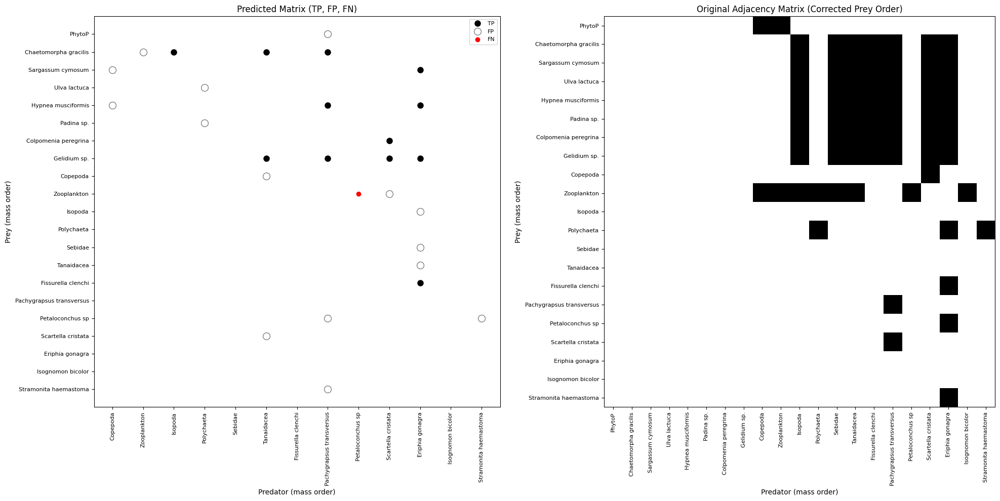

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.sparse import coo_matrix, csc_matrix, csr_matrix

# === Load CSV prediction results ===
tp = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_TP_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])
fp = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_FP_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])
fn = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_FN_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])

# === Load .mat adjacency and metadata ===
mat_data = scipy.io.loadmat("../../src/matlab/data/foodwebs_mat/PGUBP3_tax_mass.mat")
net = mat_data['net']
taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
mass = mat_data['mass'].flatten()

# === Sort species by mass ===
taxonomy_df = pd.DataFrame({'Species': taxonomy, 'Mass': mass})
taxonomy_df = taxonomy_df.dropna().sort_values(by='Mass').reset_index(drop=True)
sorted_species = taxonomy_df['Species'].tolist()
species_index = {name: i for i, name in enumerate(sorted_species)}
N = len(sorted_species)

# === Sort adjacency matrix by mass ===
if isinstance(net, coo_matrix):
    net = net.tocsr()
elif isinstance(net, (np.ndarray, list)):
    net = csr_matrix(net)

# Reorder by taxonomy mass order
idx_sorted = [taxonomy.index(sp) for sp in sorted_species]
adj_sorted = net[np.ix_(idx_sorted, idx_sorted)]

# Convert to float dense matrix
adj_sorted_dense = adj_sorted.toarray().astype(float)
adj_sorted_inverted = adj_sorted_dense[::-1, :]  # flip rows only
sorted_species_reversed = sorted_species[::-1]   # for correct tick labels

# === Filter and build predicted matrix ===
tp = tp[tp['Prey'].isin(species_index) & tp['Predator'].isin(species_index)]
fp = fp[fp['Prey'].isin(species_index) & fp['Predator'].isin(species_index)]
fn = fn[fn['Prey'].isin(species_index) & fn['Predator'].isin(species_index)]

pred_matrix = [['' for _ in range(N)] for _ in range(N)]
for df, label in zip([tp, fp, fn], ['TP', 'FP', 'FN']):
    for _, row in df.iterrows():
        i = species_index[row['Prey']]
        j = species_index[row['Predator']]
        pred_matrix[i][j] = label

# === Plotting ===
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Left: Predicted Matrix
ax1 = axs[0]
for i in range(N):
    for j in range(N):
        tag = pred_matrix[i][j]
        if tag == 'TP':
            ax1.plot(j, i, 'o', markerfacecolor='black', markeredgecolor='black', markersize=8)
        elif tag == 'FP':
            ax1.plot(j, i, 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10)
        elif tag == 'FN':
            ax1.plot(j, i, 'o', markerfacecolor='red', markeredgecolor='red', markersize=6)

ax1.set_title("Predicted Matrix (TP, FP, FN)")
ax1.set_xticks(range(N))
ax1.set_yticks(range(N))
ax1.set_xticklabels(sorted_species, rotation=90, fontsize=8)
ax1.set_yticklabels(sorted_species, fontsize=8)
ax1.set_xlabel("Predator (mass order)")
ax1.set_ylabel("Prey (mass order)")
ax1.invert_yaxis()
ax1.grid(False)
ax1.plot([], [], 'o', markerfacecolor='black', markeredgecolor='black', markersize=8, label='TP')
ax1.plot([], [], 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10, label='FP')
ax1.plot([], [], 'o', markerfacecolor='red', markeredgecolor='red', markersize=6, label='FN')
ax1.legend(loc='upper right', fontsize=8)

# Right: Adjacency Matrix
ax2 = axs[1]
ax2.imshow(adj_sorted_inverted, cmap='Greys', interpolation='none')
ax2.set_title("Original Adjacency Matrix (Corrected Prey Order)")
ax2.set_xticks(range(N))
ax2.set_yticks(range(N))
ax2.set_xticklabels(sorted_species, rotation=90, fontsize=8)
ax2.set_yticklabels(sorted_species_reversed, fontsize=8)
ax2.set_xlabel("Predator (mass order)")
ax2.set_ylabel("Prey (mass order)")
ax2.invert_yaxis()

plt.tight_layout()
plt.show()

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.sparse import coo_matrix, csc_matrix, csr_matrix

# === Load CSV prediction results ===
tp = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_TP_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])
fp = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_FP_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])
fn = pd.read_csv("../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/PGUBP3_tax_mass_K_10_FN_links_evaluate_on_all_unseen-true.csv").dropna(subset=['Prey', 'Predator'])
tp

,Prey,Predator,PreyMass,PredatorMass
0,Chaetomorpha gracilis,Isopoda,0.000228,0.01
1,Chaetomorpha gracilis,Tanaidacea,0.000228,0.01
2,Gelidium sp.,Tanaidacea,0.000228,0.01
3,Chaetomorpha gracilis,Pachygrapsus transversus,0.000228,0.36
4,Colpomenia peregrina,Scartella cristata,0.000228,0.36
5,Gelidium sp.,Pachygrapsus transversus,0.000228,0.36
6,Gelidium sp.,Scartella cristata,0.000228,0.36
7,Hypnea musciformis,Pachygrapsus transversus,0.000228,0.36
8,Fissurella clenchi,Eriphia gonagra,0.120000,0.63
9,Gelidium sp.,Eriphia gonagra,0.000228,0.63


In [20]:
fp

,Prey,Predator,PreyMass,PredatorMass
0,Chaetomorpha gracilis,Zooplankton,0.000228,0.001
1,Hypnea musciformis,Copepoda,0.000228,0.001
2,Sargassum cymosum,Copepoda,0.000228,0.001
3,Copepoda,Tanaidacea,0.001000,0.010
4,Padina sp.,Polychaeta,0.000228,0.010
5,Scartella cristata,Tanaidacea,0.360000,0.010
6,Ulva lactuca,Polychaeta,0.000228,0.010
7,Petaloconchus sp,Pachygrapsus transversus,0.360000,0.360
8,PhytoP,Pachygrapsus transversus,0.000100,0.360
9,Stramonita haemastoma,Pachygrapsus transversus,2.710000,0.360


In [21]:
fn

,Prey,Predator,PreyMass,PredatorMass
0,Zooplankton,Petaloconchus sp,0.001,0.36


In [22]:
# === Load .mat adjacency and metadata ===
mat_data = scipy.io.loadmat("../../src/matlab/data/foodwebs_mat/PGUBP3_tax_mass.mat")
net = mat_data['net']
taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
mass = mat_data['mass'].flatten()

# Ensure sparse matrix format
if isinstance(net, np.ndarray):
    net = csr_matrix(net)

# List all links in the original adjacency matrix
original_links = []
net_array = net.toarray()
for i in range(net_array.shape[0]):
    for j in range(net_array.shape[1]):
        if net_array[i, j] == 1:
            prey = taxonomy[i]
            predator = taxonomy[j]
            original_links.append((prey, predator))

# Convert to DataFrame
original_df = pd.DataFrame(original_links, columns=['Prey', 'Predator'])
original_df

,Prey,Predator
0,Chaetomorpha gracilis,Eriphia gonagra
1,Chaetomorpha gracilis,Fissurella clenchi
2,Chaetomorpha gracilis,Isopoda
3,Chaetomorpha gracilis,Pachygrapsus transversus
4,Chaetomorpha gracilis,Scartella cristata
...,...,...
63,Zooplankton,Petaloconchus sp
64,Zooplankton,Polychaeta
65,Zooplankton,Sebidae
66,Zooplankton,Tanaidacea


# Plot Predation Matrix vs Adjacency Matrix (Ground truth) when evaluate_on_all_unseen = true


=== Processing: PGUBP3_tax_mass ===


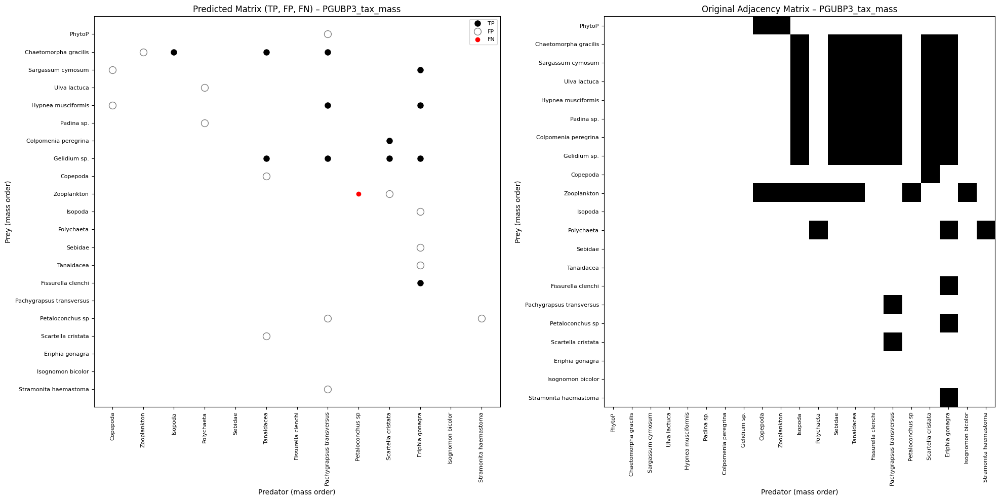


=== Processing: CGP1_tax_mass ===


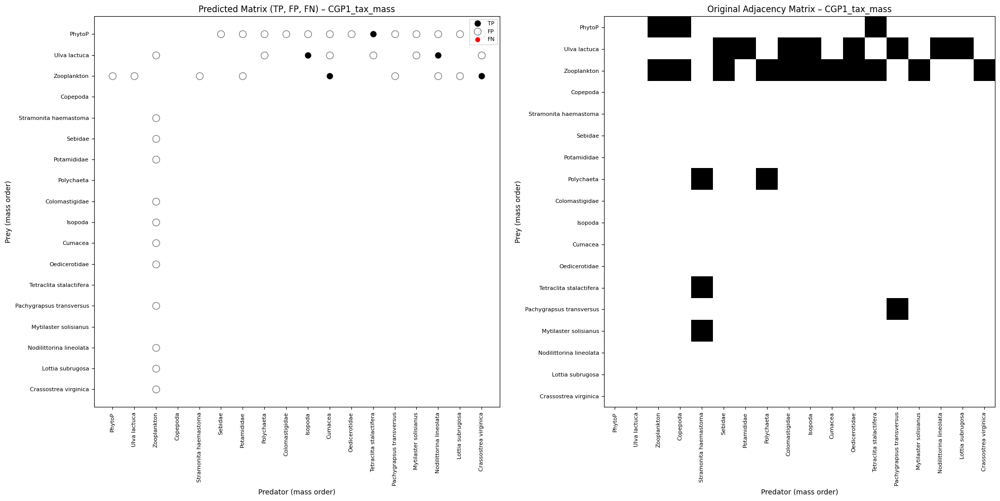


=== Processing: SF2M2_tax_mass ===


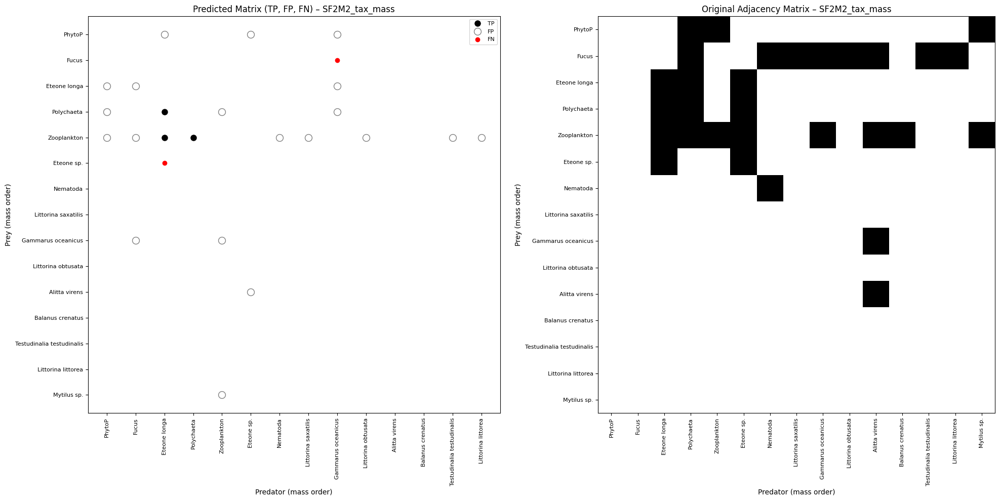


=== Processing: Twin Lake East_tax_mass ===


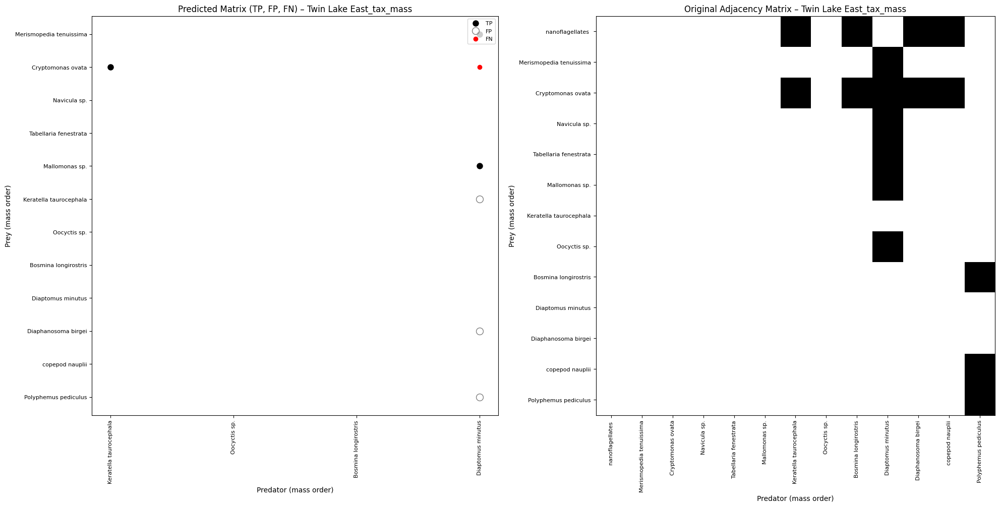


=== Processing: SF1I2_tax_mass ===


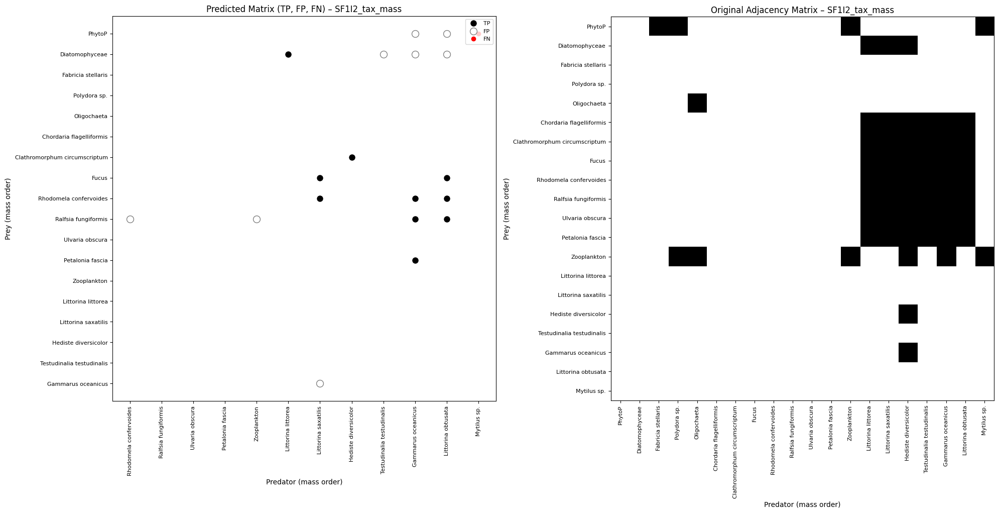


=== Processing: SF1I4_tax_mass ===


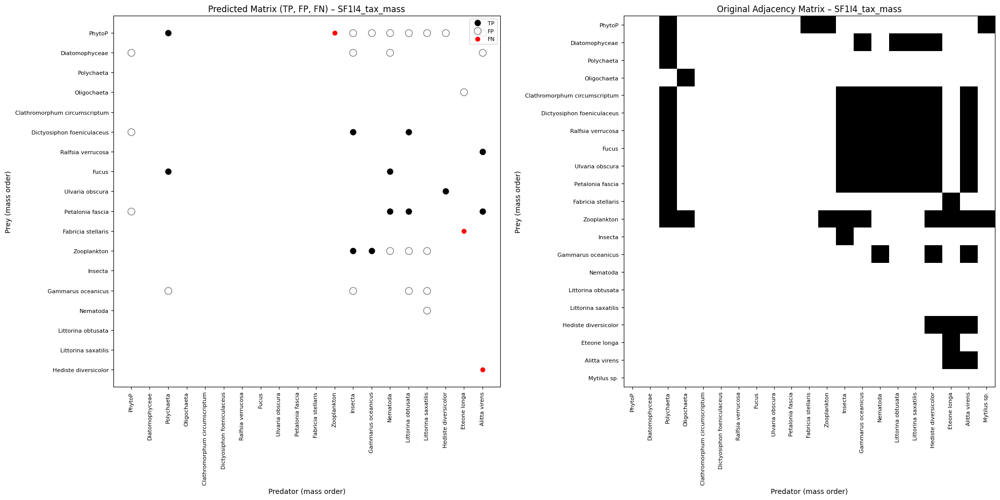


=== Processing: PP1I1_tax_mass ===


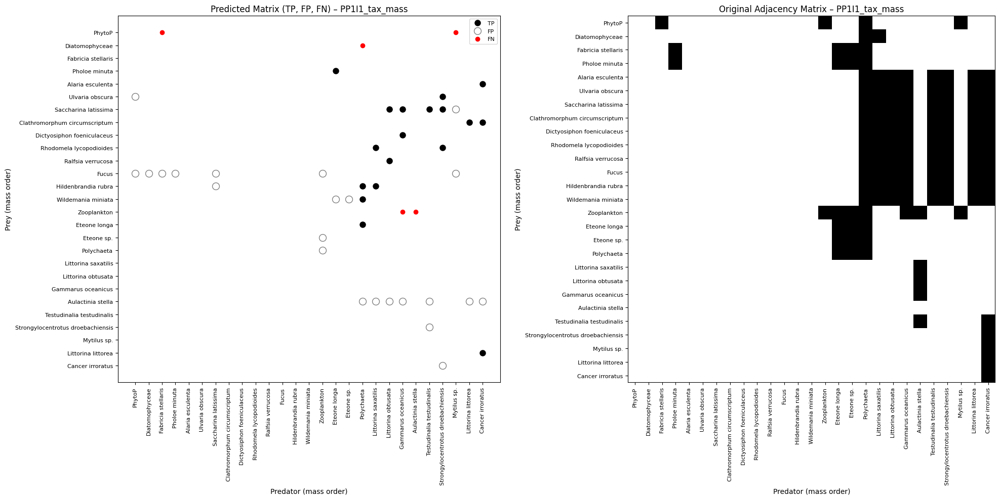


=== Processing: CGP3_tax_mass ===


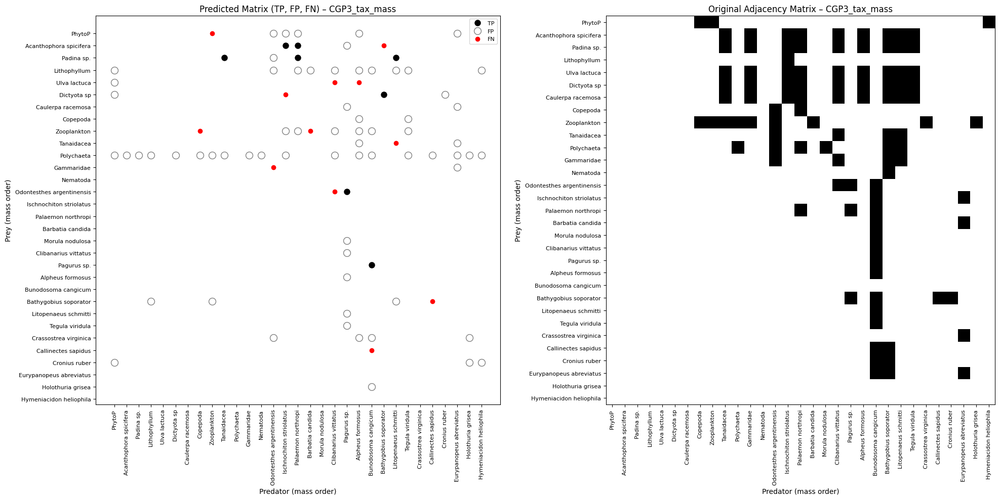


=== Processing: Indian Lake_tax_mass ===


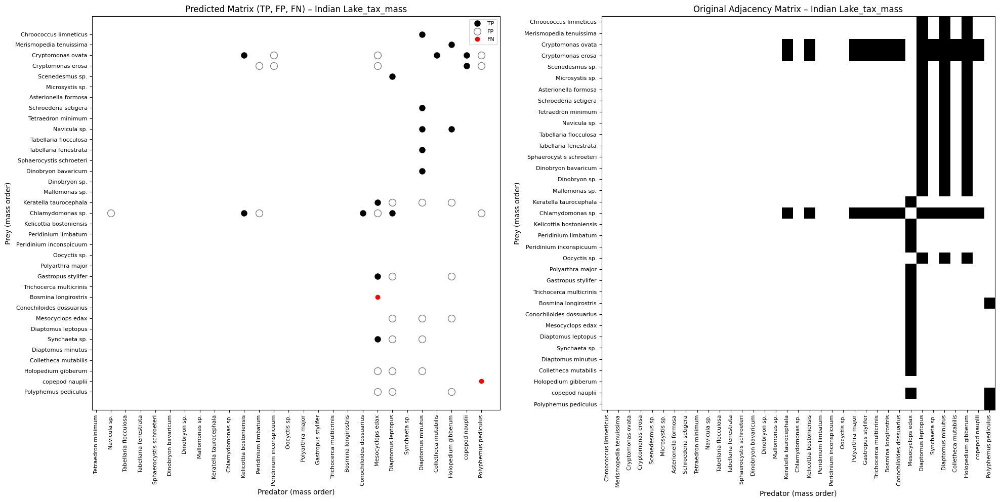


=== Processing: Brook trout lake_tax_mass ===


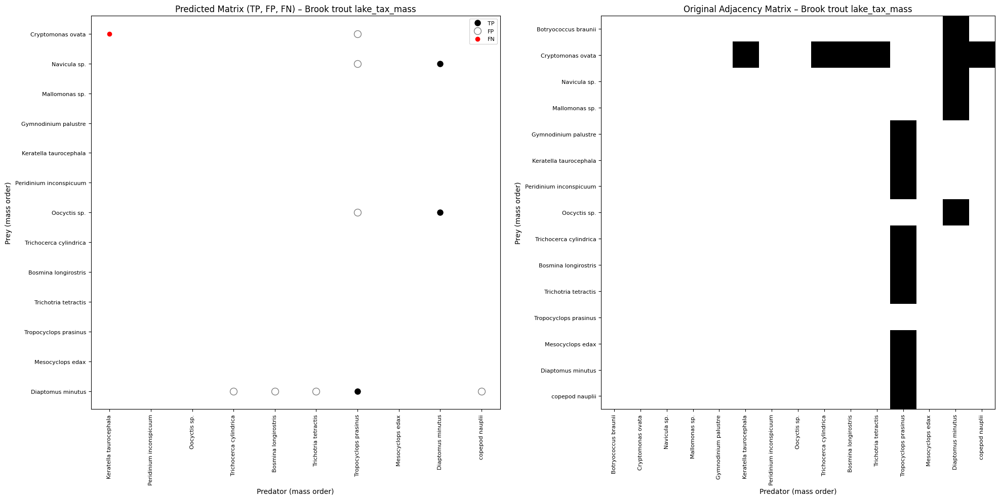


=== Processing: MBP3_tax_mass ===


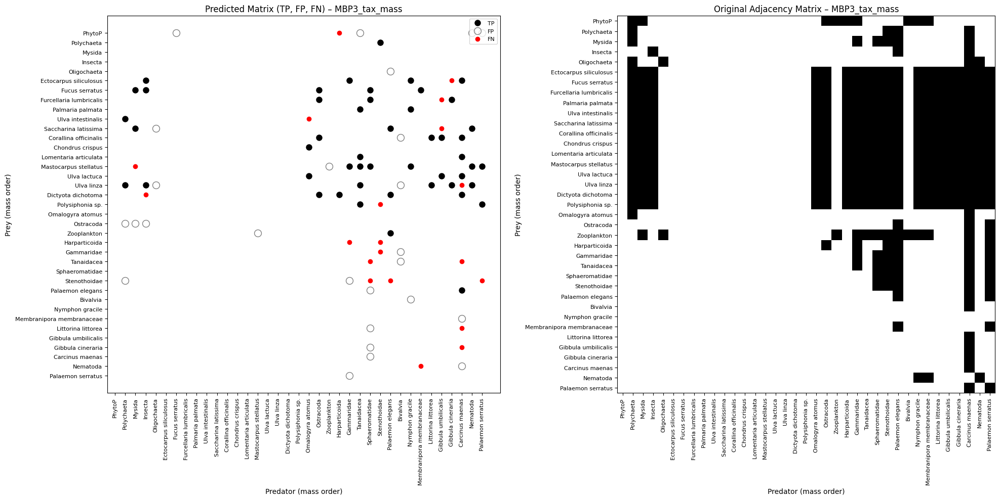


=== Processing: L4P3_tax_mass ===


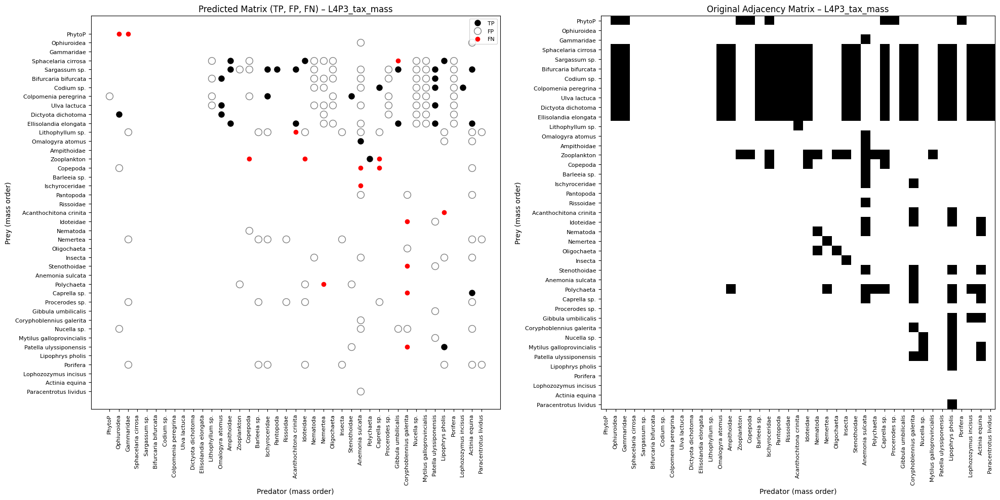


=== Processing: L2P1_tax_mass ===


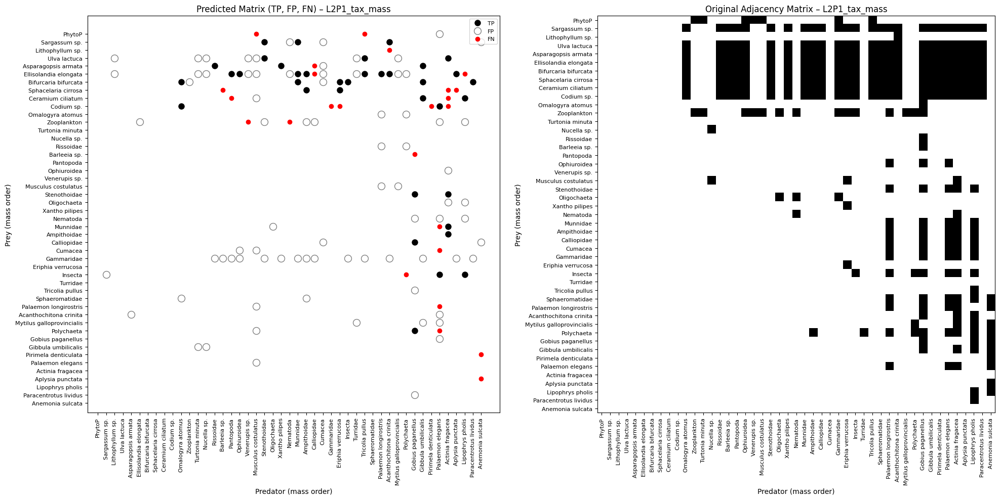


=== Processing: WP4_tax_mass ===


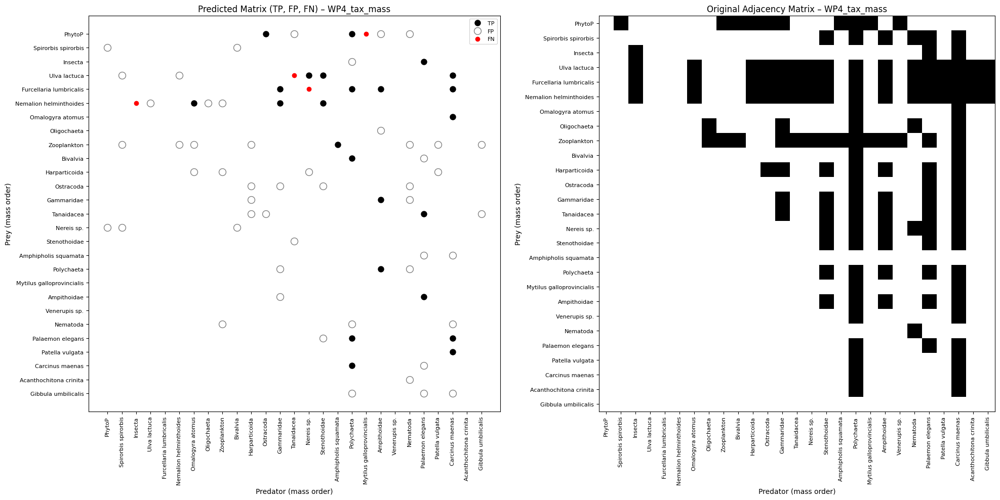


=== Processing: Gearagh_tax_mass ===


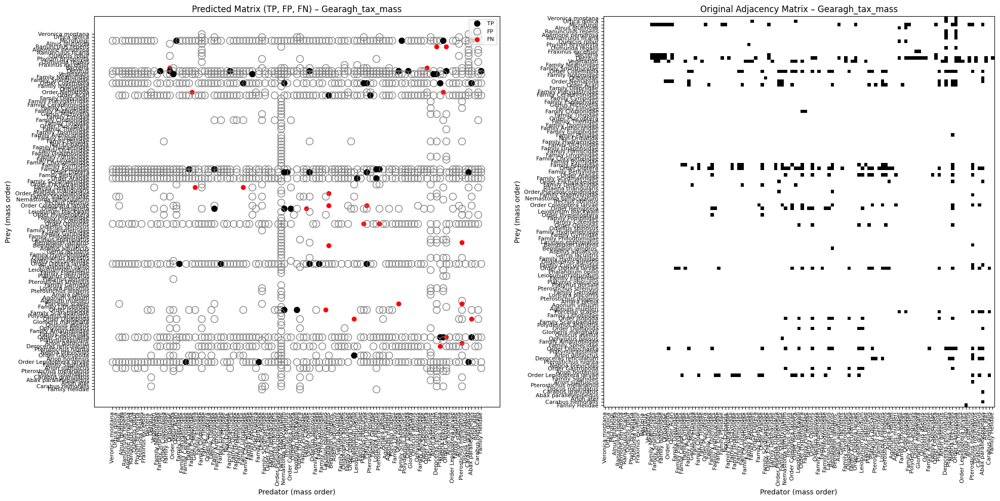


=== Processing: MBP1_tax_mass ===


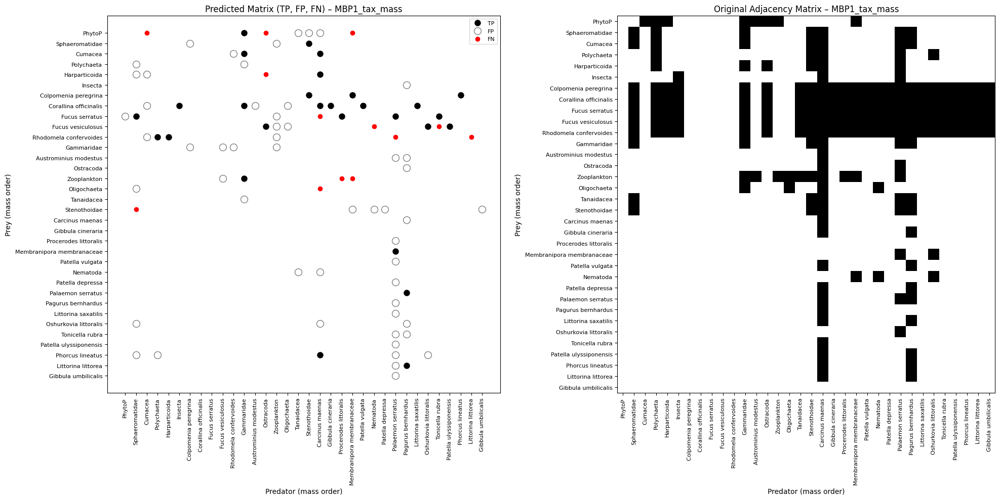


=== Processing: GJBP3_tax_mass ===


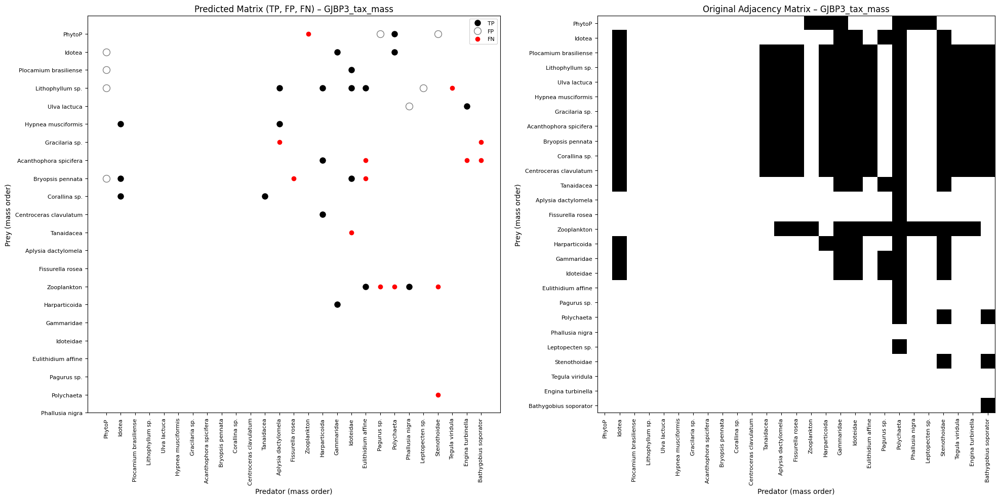


=== Processing: German Creek_tax_mass ===
Skipping German Creek_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/German Creek_tax_mass_K_10_TP_links_evaluate_on_all_unseen-true.csv'

=== Processing: Ythan Estuary_tax_mass ===
Skipping Ythan Estuary_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_TP_links_evaluate_on_all_unseen-true.csv'

=== Processing: Fawn lake_tax_mass ===
Skipping Fawn lake_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Fawn lake_tax_mass_K_10_TP_links_evaluate_on_all_unseen-true.csv'

=== Processing: Chilean Intertidal El Quisco_tax_mass ===
Skipping Chilean Intertidal El Quisco_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.sparse import coo_matrix, csr_matrix
import os

# === Load foodweb names list ===
foodwebs_list_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")  # adjust path if needed

# === Base paths ===
base_csv_path = "../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv"
base_mat_path = "../../src/matlab/data/foodwebs_mat"

# === Iterate over each foodweb ===
for foodweb in foodwebs_list_df["Foodweb"]:
    print(f"\n=== Processing: {foodweb} ===")
    
    try:
        # === Load CSV prediction results ===
        tp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_TP_links_evaluate_on_all_unseen-true.csv")
        fp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_FP_links_evaluate_on_all_unseen-true.csv")
        fn_file = os.path.join(base_csv_path, f"{foodweb}_K_10_FN_links_evaluate_on_all_unseen-true.csv")
        mat_file = os.path.join(base_mat_path, f"{foodweb}.mat")

        tp = pd.read_csv(tp_file).dropna(subset=['Prey', 'Predator'])
        fp = pd.read_csv(fp_file).dropna(subset=['Prey', 'Predator'])
        fn = pd.read_csv(fn_file).dropna(subset=['Prey', 'Predator'])

        # === Load .mat adjacency and metadata ===
        mat_data = scipy.io.loadmat(mat_file)
        net = mat_data['net']
        taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
        mass = mat_data['mass'].flatten()

        # === Sort species by mass ===
        taxonomy_df = pd.DataFrame({'Species': taxonomy, 'Mass': mass})
        taxonomy_df = taxonomy_df.dropna().sort_values(by='Mass').reset_index(drop=True)
        sorted_species = taxonomy_df['Species'].tolist()
        species_index = {name: i for i, name in enumerate(sorted_species)}
        N = len(sorted_species)

        # === Sort adjacency matrix by mass ===
        if isinstance(net, coo_matrix):
            net = net.tocsr()
        elif isinstance(net, (np.ndarray, list)):
            net = csr_matrix(net)

        idx_sorted = [taxonomy.index(sp) for sp in sorted_species]
        adj_sorted = net[np.ix_(idx_sorted, idx_sorted)]

        # Convert to float dense matrix
        adj_sorted_dense = adj_sorted.toarray().astype(float)
        adj_sorted_inverted = adj_sorted_dense[::-1, :]
        sorted_species_reversed = sorted_species[::-1]

        # === Filter and build predicted matrix ===
        tp = tp[tp['Prey'].isin(species_index) & tp['Predator'].isin(species_index)]
        fp = fp[fp['Prey'].isin(species_index) & fp['Predator'].isin(species_index)]
        fn = fn[fn['Prey'].isin(species_index) & fn['Predator'].isin(species_index)]

        pred_matrix = [['' for _ in range(N)] for _ in range(N)]
        for df, label in zip([tp, fp, fn], ['TP', 'FP', 'FN']):
            for _, row in df.iterrows():
                i = species_index[row['Prey']]
                j = species_index[row['Predator']]
                pred_matrix[i][j] = label

        # === Plotting ===
        fig, axs = plt.subplots(1, 2, figsize=(20, 10))
        
        # Left: Predicted Matrix
        ax1 = axs[0]
        for i in range(N):
            for j in range(N):
                tag = pred_matrix[i][j]
                if tag == 'TP':
                    ax1.plot(j, i, 'o', markerfacecolor='black', markeredgecolor='black', markersize=8)
                elif tag == 'FP':
                    ax1.plot(j, i, 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10)
                elif tag == 'FN':
                    ax1.plot(j, i, 'o', markerfacecolor='red', markeredgecolor='red', markersize=6)

        ax1.set_title(f"Predicted Matrix (TP, FP, FN) – {foodweb}")
        ax1.set_xticks(range(N))
        ax1.set_yticks(range(N))
        ax1.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax1.set_yticklabels(sorted_species, fontsize=8)
        ax1.set_xlabel("Predator (mass order)")
        ax1.set_ylabel("Prey (mass order)")
        ax1.invert_yaxis()
        ax1.grid(False)
        ax1.plot([], [], 'o', markerfacecolor='black', markeredgecolor='black', markersize=8, label='TP')
        ax1.plot([], [], 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10, label='FP')
        ax1.plot([], [], 'o', markerfacecolor='red', markeredgecolor='red', markersize=6, label='FN')
        ax1.legend(loc='upper right', fontsize=8)

        # Right: Adjacency Matrix
        ax2 = axs[1]
        ax2.imshow(adj_sorted_inverted, cmap='Greys', interpolation='none')
        ax2.set_title(f"Original Adjacency Matrix – {foodweb}")
        ax2.set_xticks(range(N))
        ax2.set_yticks(range(N))
        ax2.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax2.set_yticklabels(sorted_species_reversed, fontsize=8)
        ax2.set_xlabel("Predator (mass order)")
        ax2.set_ylabel("Prey (mass order)")
        ax2.invert_yaxis()

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")

# Plot Predation Matrix vs Adjacency Matrix (Ground truth) when evaluate_on_all_unseen = false


=== Processing: PGUBP3_tax_mass ===


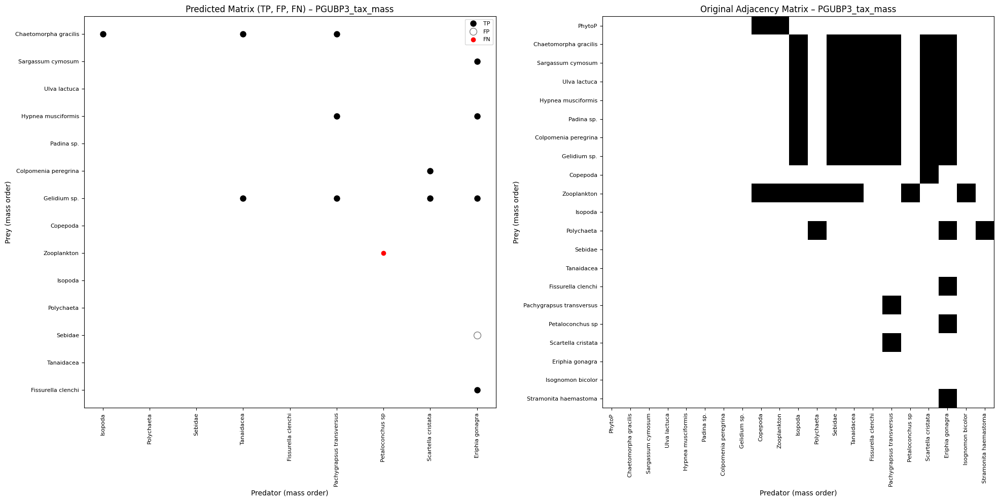


=== Processing: CGP1_tax_mass ===


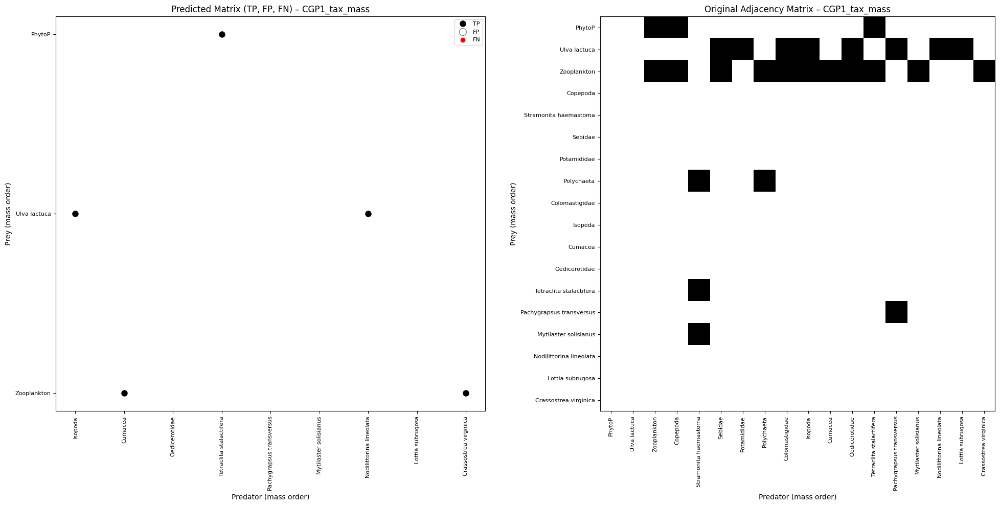


=== Processing: SF2M2_tax_mass ===


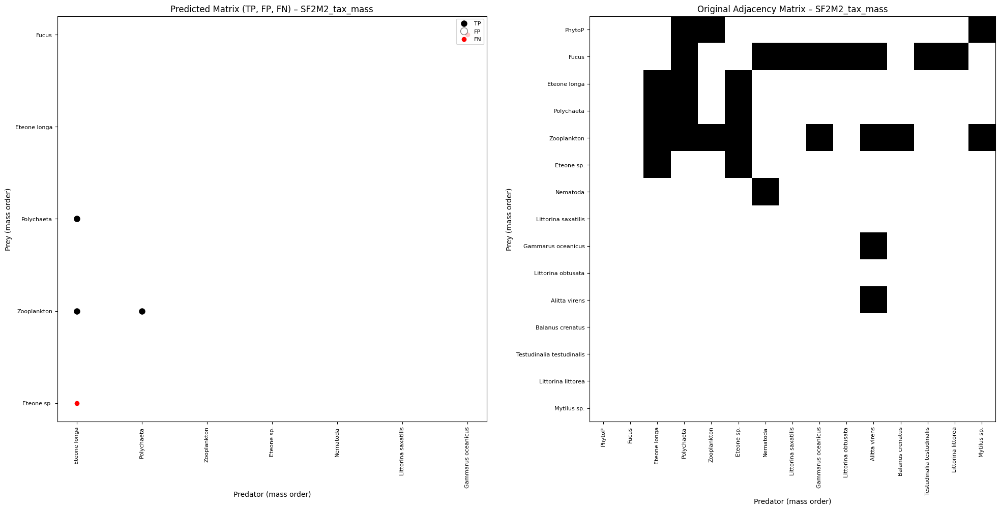


=== Processing: Twin Lake East_tax_mass ===


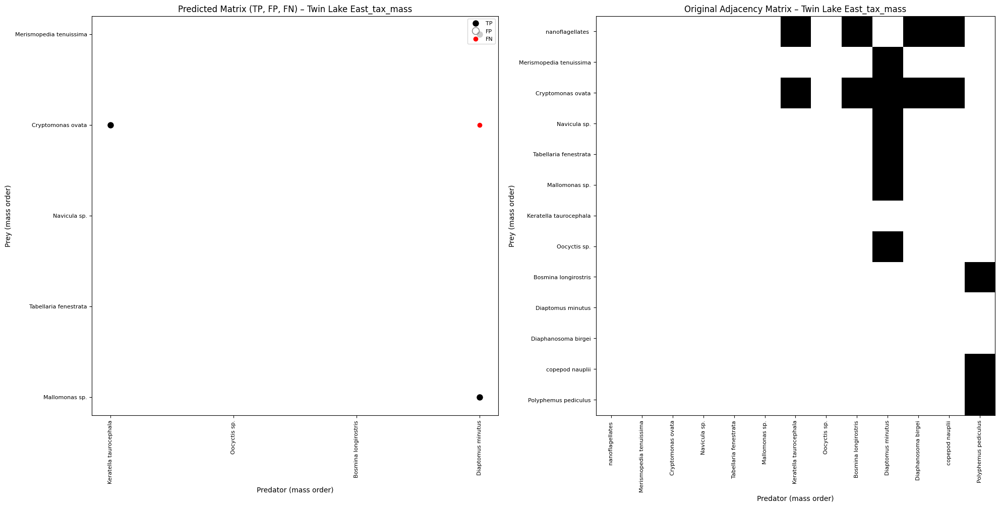


=== Processing: SF1I2_tax_mass ===


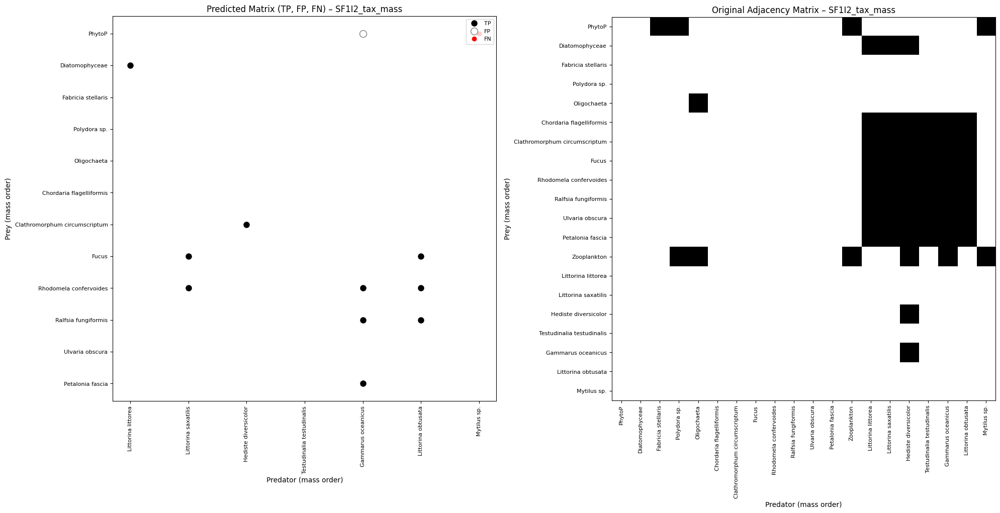


=== Processing: SF1I4_tax_mass ===


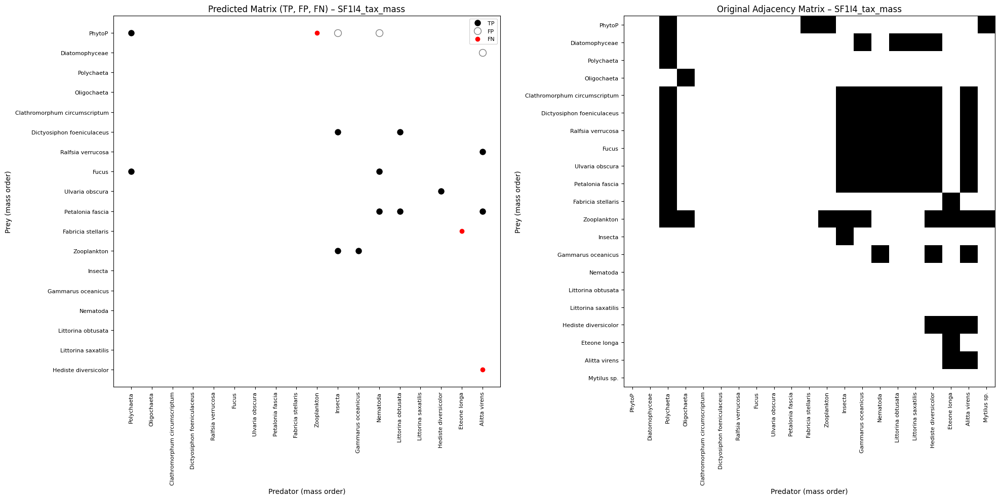


=== Processing: PP1I1_tax_mass ===


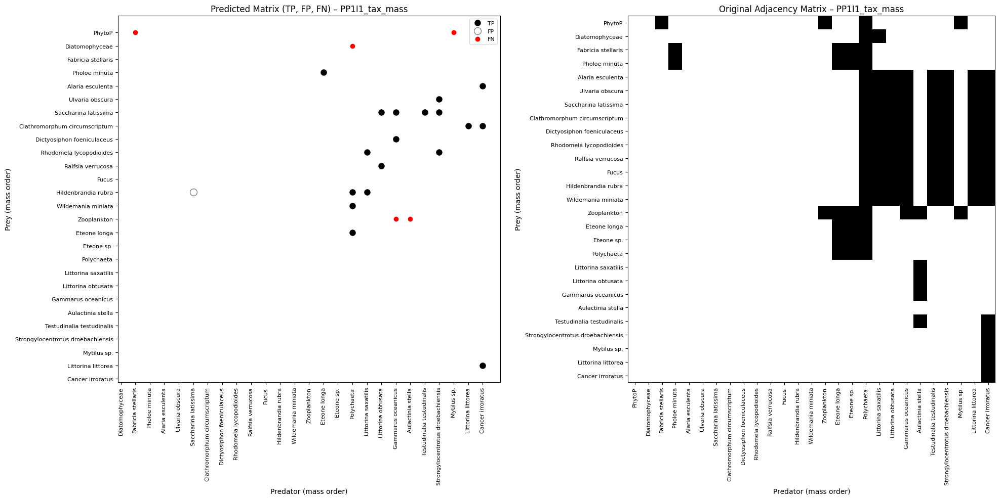


=== Processing: CGP3_tax_mass ===


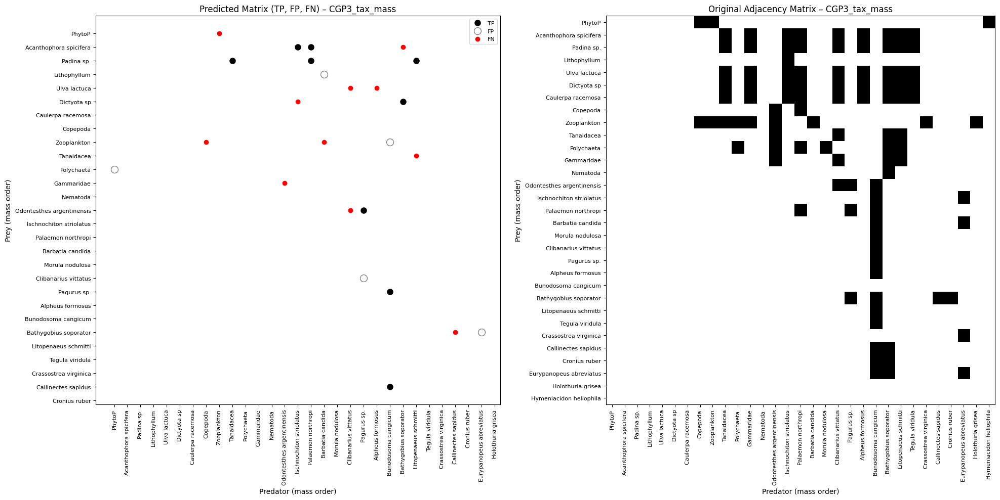


=== Processing: Indian Lake_tax_mass ===


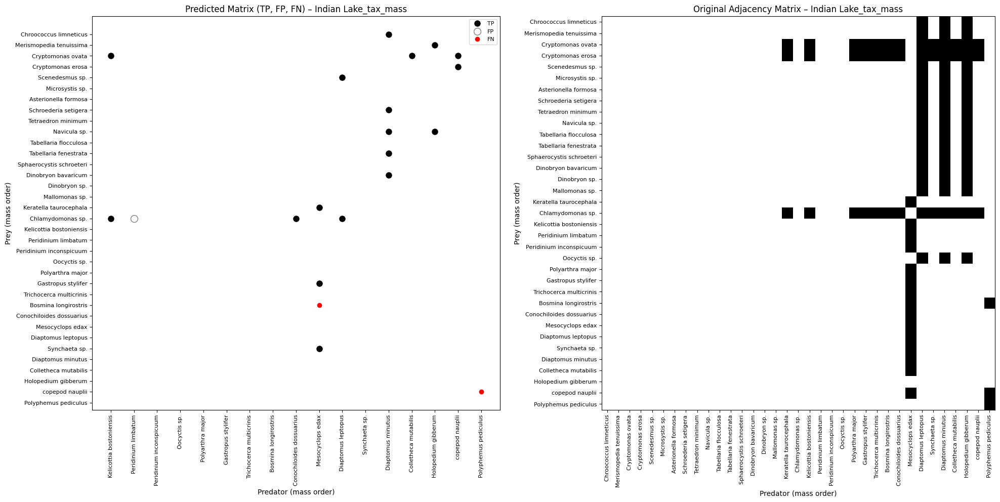


=== Processing: Brook trout lake_tax_mass ===


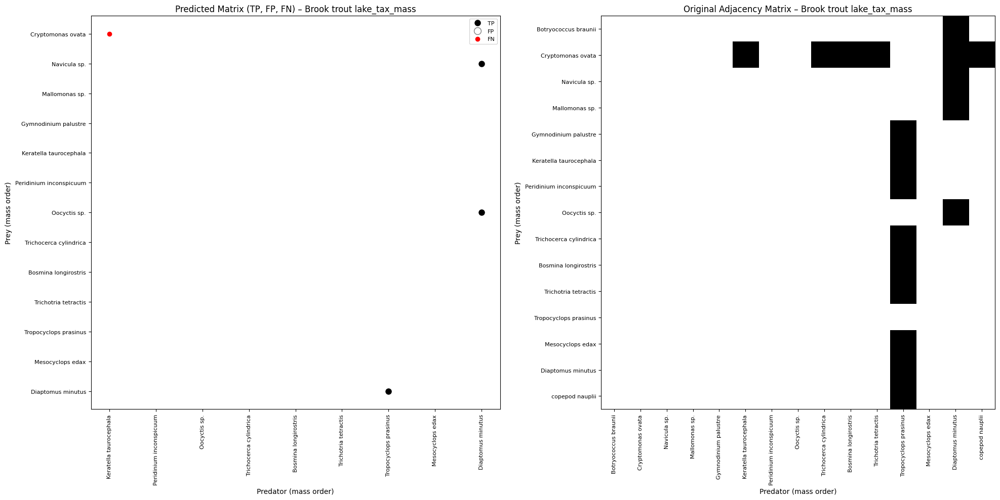


=== Processing: MBP3_tax_mass ===


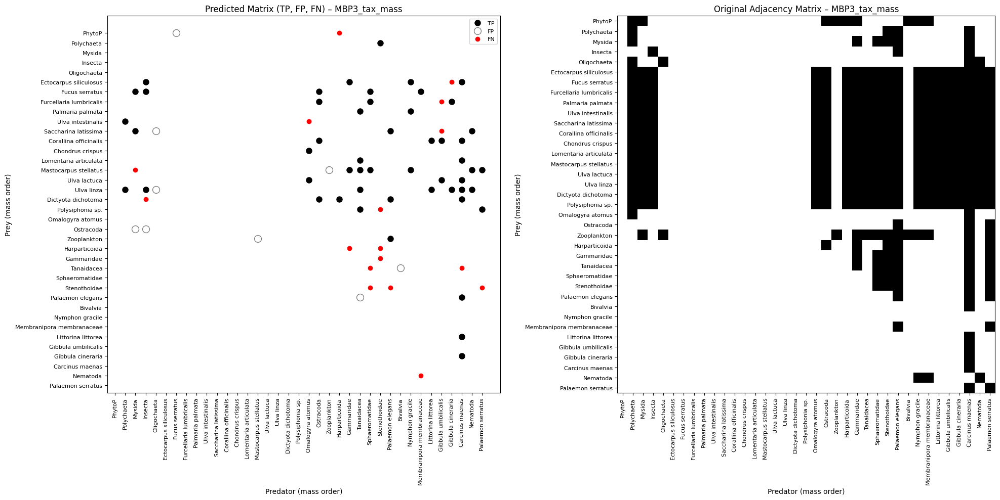


=== Processing: L4P3_tax_mass ===


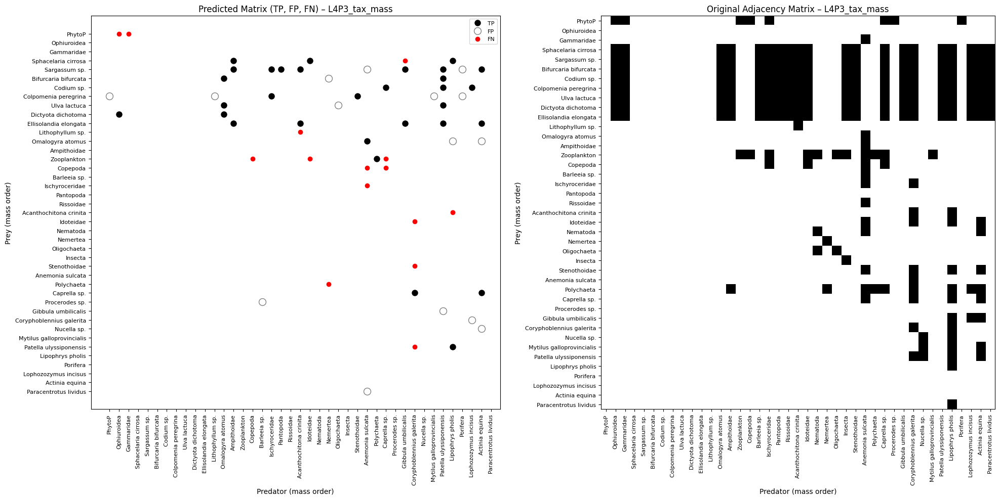


=== Processing: L2P1_tax_mass ===


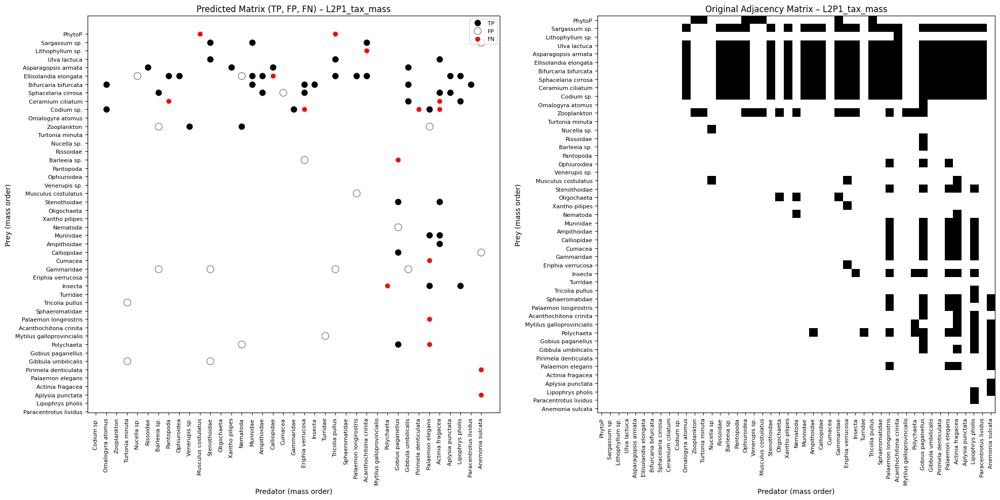


=== Processing: WP4_tax_mass ===


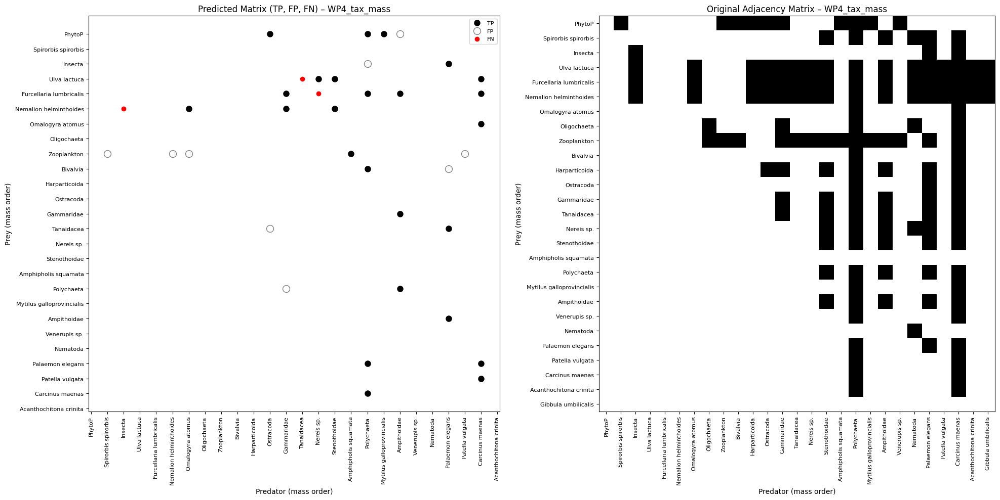


=== Processing: Gearagh_tax_mass ===


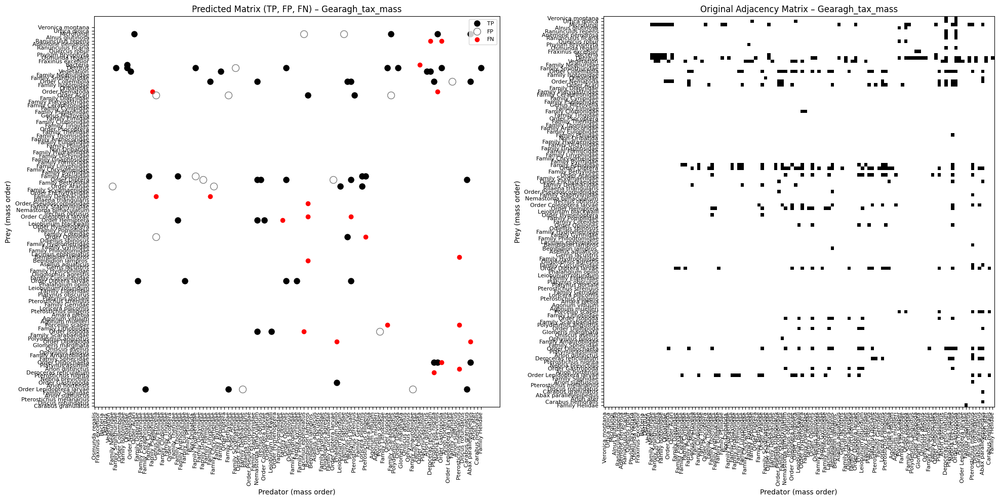


=== Processing: MBP1_tax_mass ===


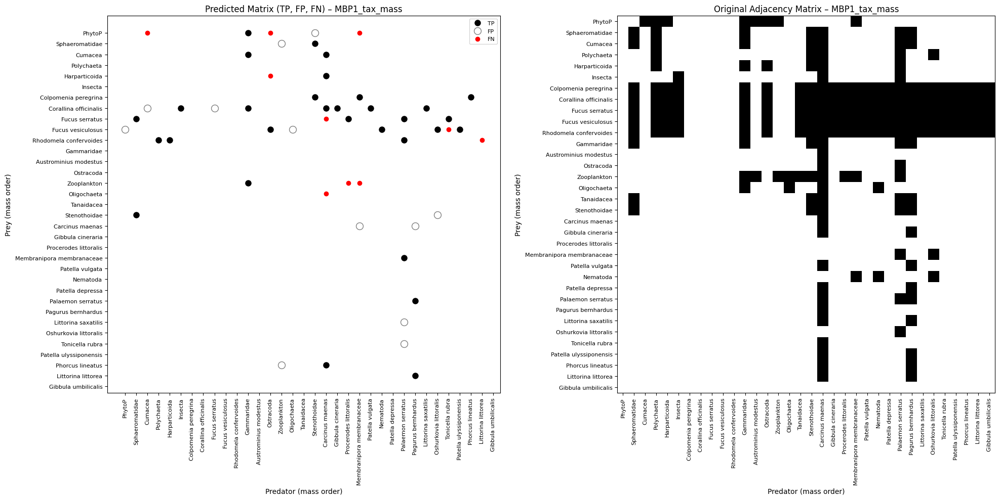


=== Processing: GJBP3_tax_mass ===


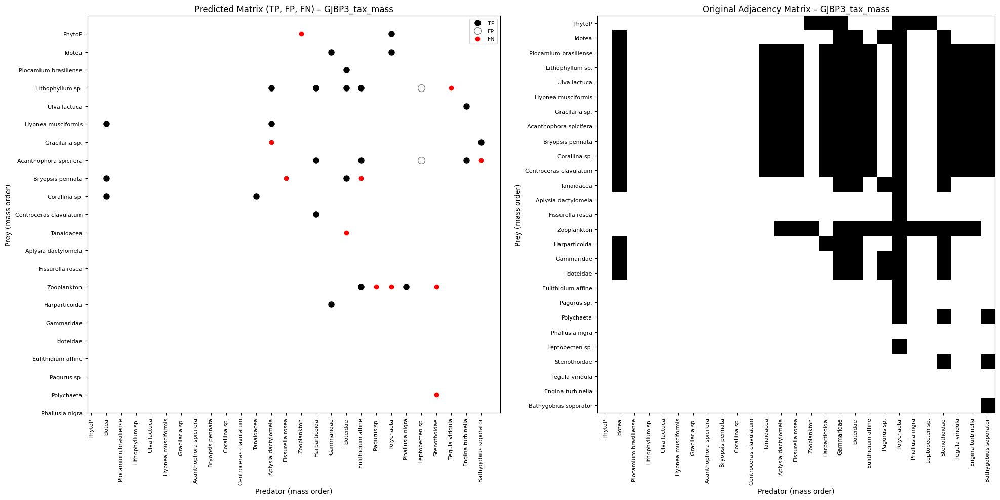


=== Processing: German Creek_tax_mass ===
Skipping German Creek_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/German Creek_tax_mass_K_10_TP_links_evaluate_on_all_unseen-false.csv'

=== Processing: Ythan Estuary_tax_mass ===
Skipping Ythan Estuary_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_TP_links_evaluate_on_all_unseen-false.csv'

=== Processing: Fawn lake_tax_mass ===
Skipping Fawn lake_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Fawn lake_tax_mass_K_10_TP_links_evaluate_on_all_unseen-false.csv'

=== Processing: Chilean Intertidal El Quisco_tax_mass ===
Skipping Chilean Intertidal El Quisco_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/r

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.sparse import coo_matrix, csr_matrix
import os

# === Load foodweb names list ===
foodwebs_list_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")  # adjust path if needed

# === Base paths ===
base_csv_path = "../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv"
base_mat_path = "../../src/matlab/data/foodwebs_mat"

# === Iterate over each foodweb ===
for foodweb in foodwebs_list_df["Foodweb"]:
    print(f"\n=== Processing: {foodweb} ===")
    
    try:
        # === Load CSV prediction results ===
        tp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_TP_links_evaluate_on_all_unseen-false.csv")
        fp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_FP_links_evaluate_on_all_unseen-false.csv")
        fn_file = os.path.join(base_csv_path, f"{foodweb}_K_10_FN_links_evaluate_on_all_unseen-false.csv")
        mat_file = os.path.join(base_mat_path, f"{foodweb}.mat")

        tp = pd.read_csv(tp_file).dropna(subset=['Prey', 'Predator'])
        fp = pd.read_csv(fp_file).dropna(subset=['Prey', 'Predator'])
        fn = pd.read_csv(fn_file).dropna(subset=['Prey', 'Predator'])

        # === Load .mat adjacency and metadata ===
        mat_data = scipy.io.loadmat(mat_file)
        net = mat_data['net']
        taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
        mass = mat_data['mass'].flatten()

        # === Sort species by mass ===
        taxonomy_df = pd.DataFrame({'Species': taxonomy, 'Mass': mass})
        taxonomy_df = taxonomy_df.dropna().sort_values(by='Mass').reset_index(drop=True)
        sorted_species = taxonomy_df['Species'].tolist()
        species_index = {name: i for i, name in enumerate(sorted_species)}
        N = len(sorted_species)

        # === Sort adjacency matrix by mass ===
        if isinstance(net, coo_matrix):
            net = net.tocsr()
        elif isinstance(net, (np.ndarray, list)):
            net = csr_matrix(net)

        idx_sorted = [taxonomy.index(sp) for sp in sorted_species]
        adj_sorted = net[np.ix_(idx_sorted, idx_sorted)]

        # Convert to float dense matrix
        adj_sorted_dense = adj_sorted.toarray().astype(float)
        adj_sorted_inverted = adj_sorted_dense[::-1, :]
        sorted_species_reversed = sorted_species[::-1]

        # === Filter and build predicted matrix ===
        tp = tp[tp['Prey'].isin(species_index) & tp['Predator'].isin(species_index)]
        fp = fp[fp['Prey'].isin(species_index) & fp['Predator'].isin(species_index)]
        fn = fn[fn['Prey'].isin(species_index) & fn['Predator'].isin(species_index)]

        pred_matrix = [['' for _ in range(N)] for _ in range(N)]
        for df, label in zip([tp, fp, fn], ['TP', 'FP', 'FN']):
            for _, row in df.iterrows():
                i = species_index[row['Prey']]
                j = species_index[row['Predator']]
                pred_matrix[i][j] = label

        # === Plotting ===
        fig, axs = plt.subplots(1, 2, figsize=(20, 10))
        
        # Left: Predicted Matrix
        ax1 = axs[0]
        for i in range(N):
            for j in range(N):
                tag = pred_matrix[i][j]
                if tag == 'TP':
                    ax1.plot(j, i, 'o', markerfacecolor='black', markeredgecolor='black', markersize=8)
                elif tag == 'FP':
                    ax1.plot(j, i, 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10)
                elif tag == 'FN':
                    ax1.plot(j, i, 'o', markerfacecolor='red', markeredgecolor='red', markersize=6)

        ax1.set_title(f"Predicted Matrix (TP, FP, FN) – {foodweb}")
        ax1.set_xticks(range(N))
        ax1.set_yticks(range(N))
        ax1.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax1.set_yticklabels(sorted_species, fontsize=8)
        ax1.set_xlabel("Predator (mass order)")
        ax1.set_ylabel("Prey (mass order)")
        ax1.invert_yaxis()
        ax1.grid(False)
        ax1.plot([], [], 'o', markerfacecolor='black', markeredgecolor='black', markersize=8, label='TP')
        ax1.plot([], [], 'o', markerfacecolor='none', markeredgecolor='gray', markersize=10, label='FP')
        ax1.plot([], [], 'o', markerfacecolor='red', markeredgecolor='red', markersize=6, label='FN')
        ax1.legend(loc='upper right', fontsize=8)

        # Right: Adjacency Matrix
        ax2 = axs[1]
        ax2.imshow(adj_sorted_inverted, cmap='Greys', interpolation='none')
        ax2.set_title(f"Original Adjacency Matrix – {foodweb}")
        ax2.set_xticks(range(N))
        ax2.set_yticks(range(N))
        ax2.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax2.set_yticklabels(sorted_species_reversed, fontsize=8)
        ax2.set_xlabel("Predator (mass order)")
        ax2.set_ylabel("Prey (mass order)")
        ax2.invert_yaxis()

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")

# Precision-Recall Curve

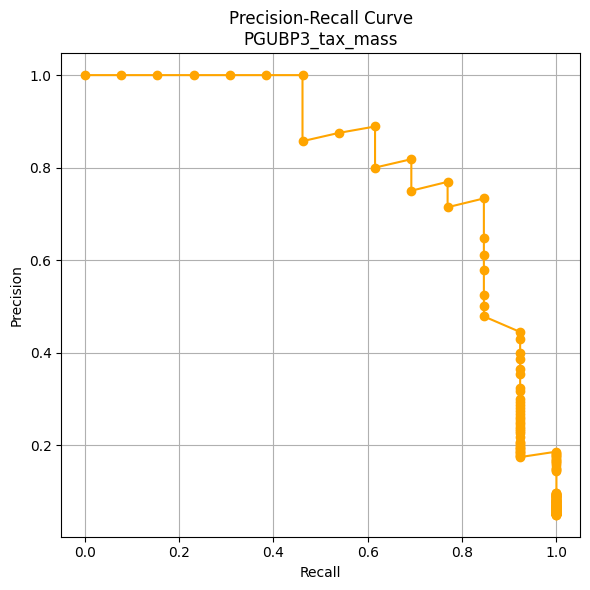

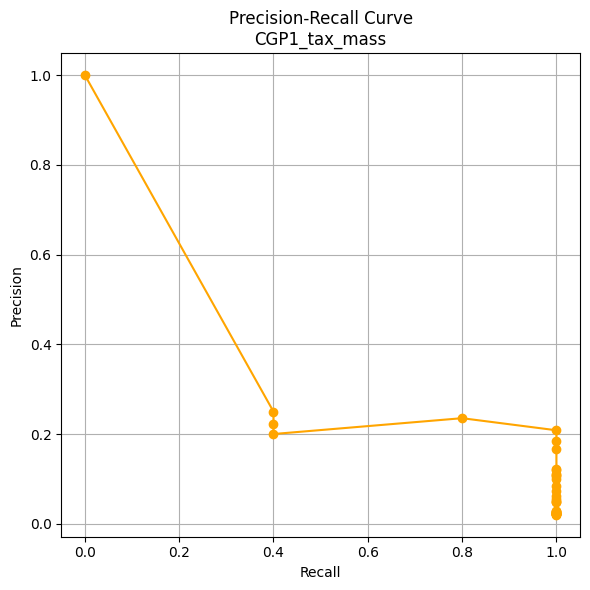

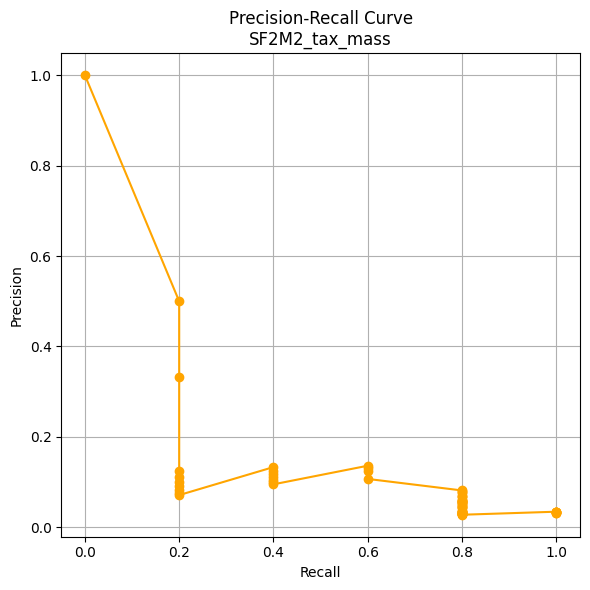

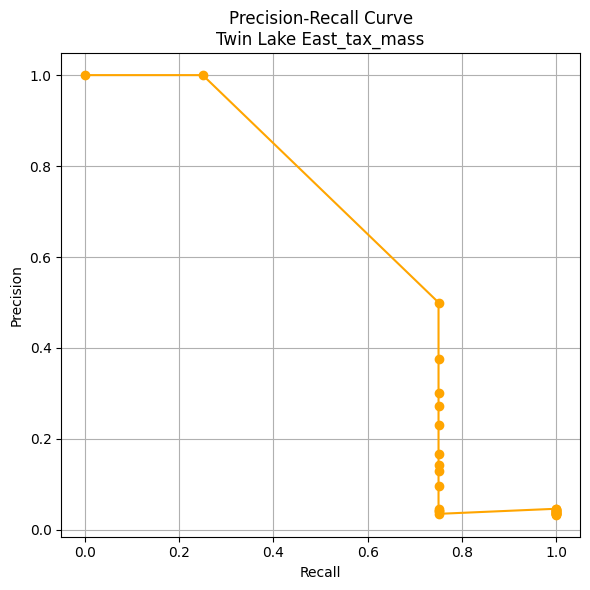

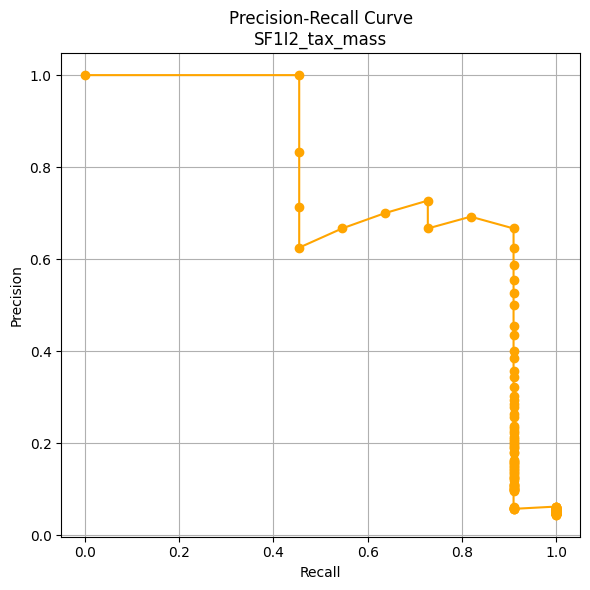

...

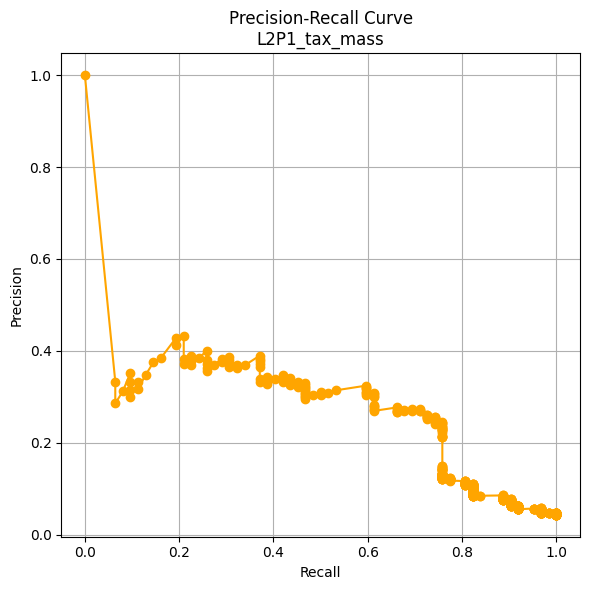

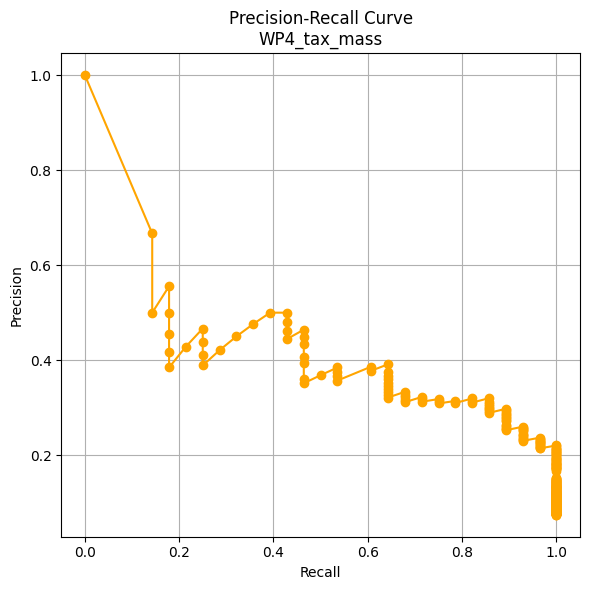

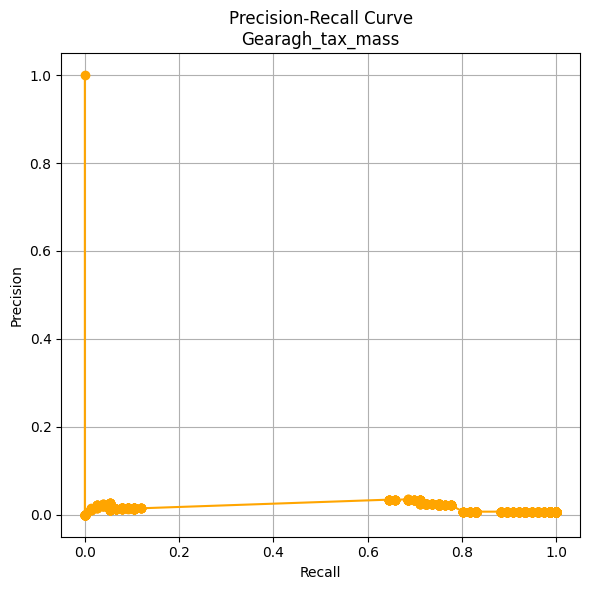

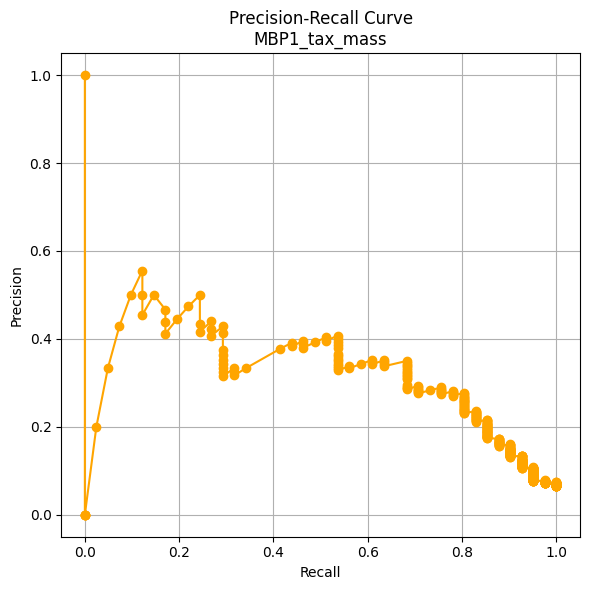

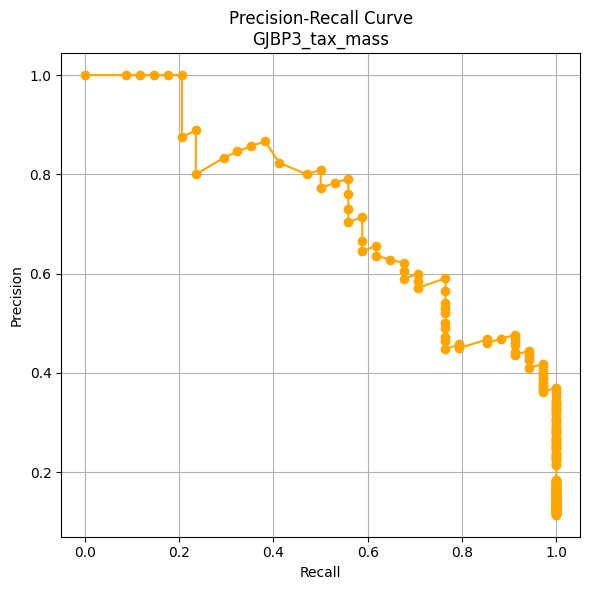

Skipping German Creek_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/German Creek_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Ythan Estuary_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Fawn lake_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Fawn lake_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Chilean Intertidal El Quisco_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Chilean Intertidal El Quisco_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping SEW01_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
import os

# === Load list of food webs ===
foodwebs_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base path where score-label CSVs are stored ===
base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv"

# === Loop through each food web ===
for foodweb in foodwebs_df["Foodweb"]:
    file_path = os.path.join(base_path, f"{foodweb}_K_10_scores_labels_evaluate_on_all_unseen-true.csv")

    try:
        df = pd.read_csv(file_path)
        precision, recall, thresholds = precision_recall_curve(df['Label'], df['Score'])

        # Plotting
        plt.figure(figsize=(6, 6))
        plt.plot(recall, precision, marker='o', color='orange')
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"Precision-Recall Curve\n{foodweb}")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb}: {e}")


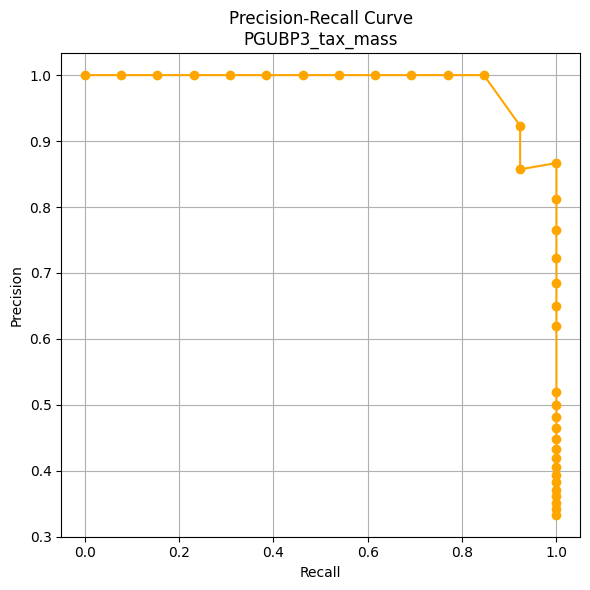

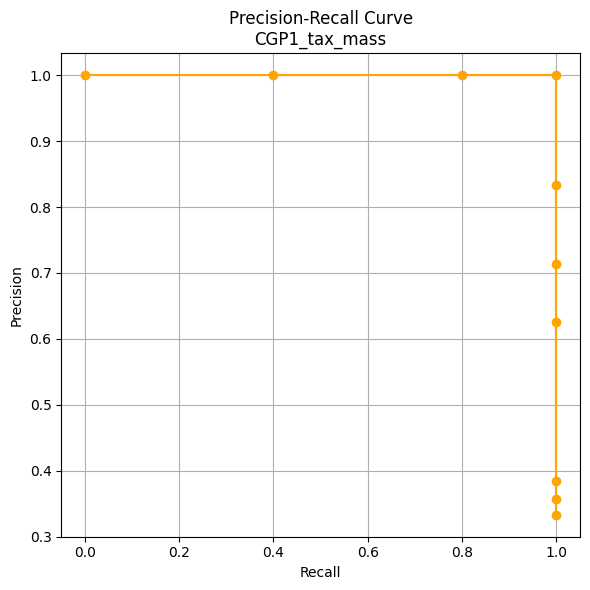

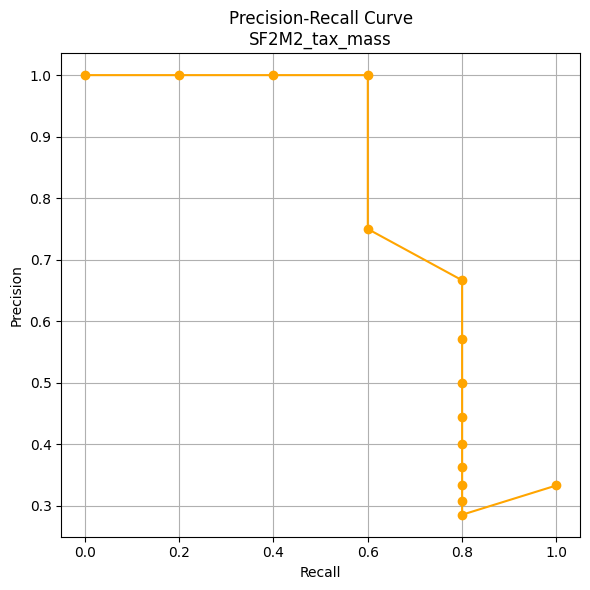

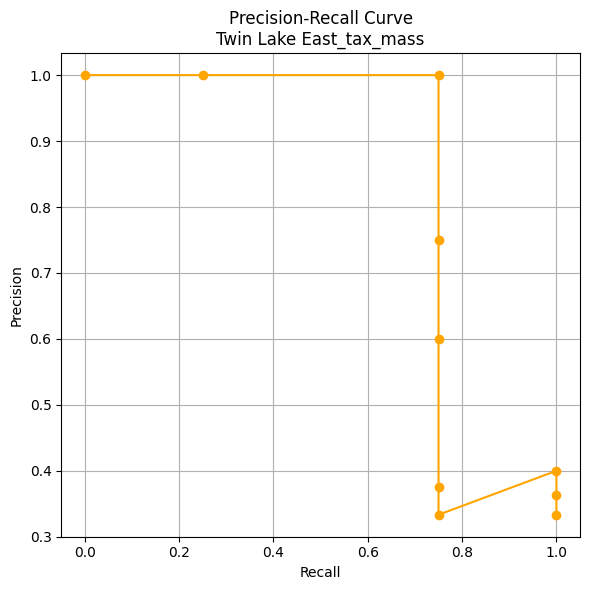

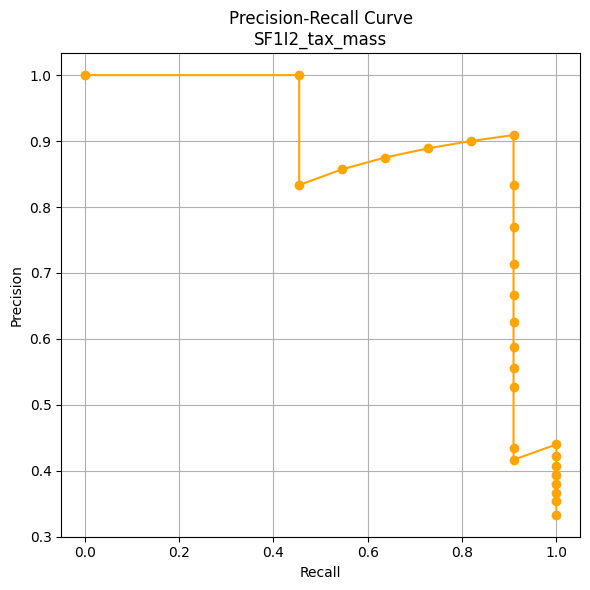

...

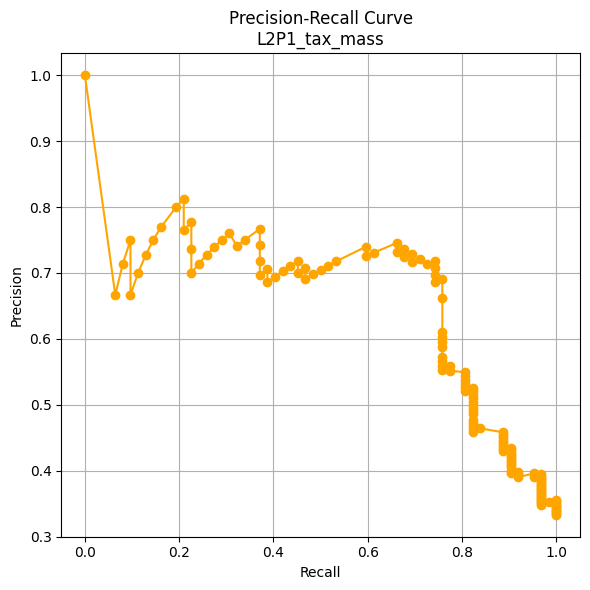

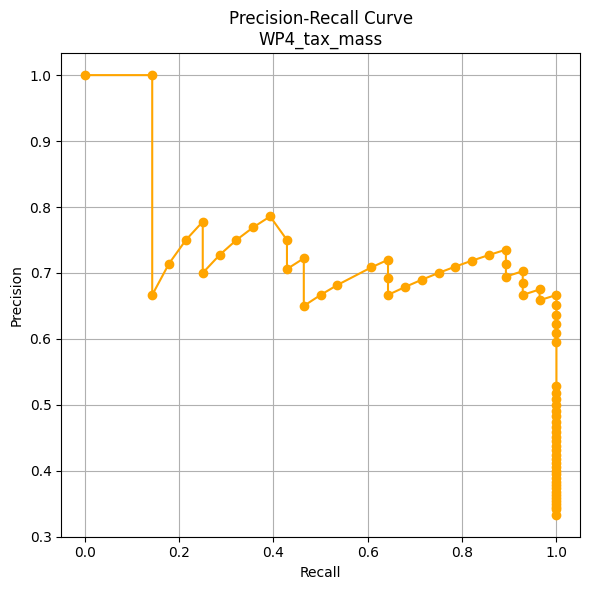

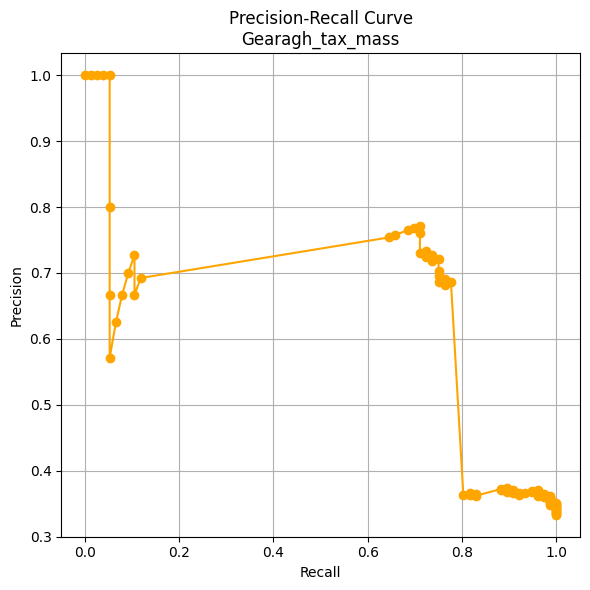

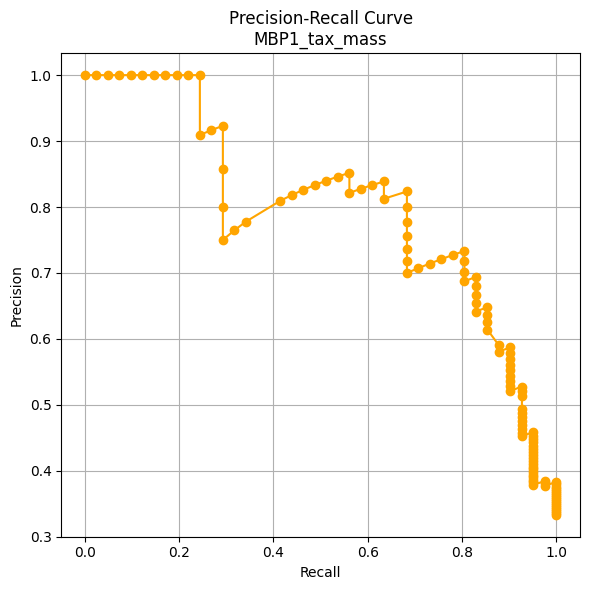

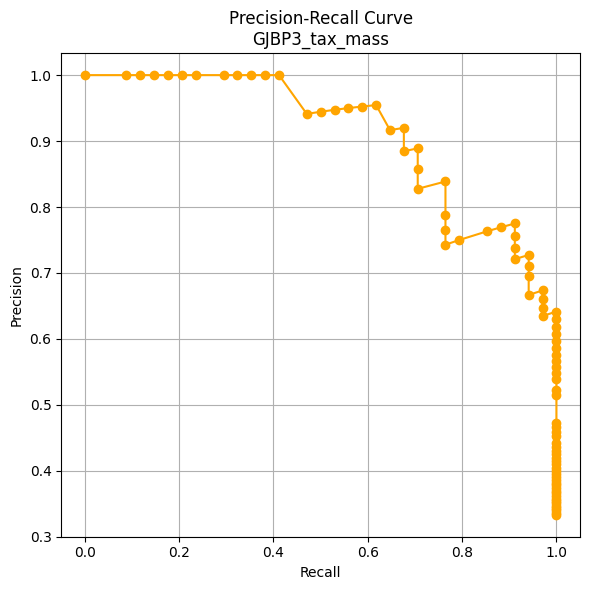

Skipping German Creek_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/German Creek_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Ythan Estuary_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Fawn lake_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Fawn lake_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Chilean Intertidal El Quisco_tax_mass: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Chilean Intertidal El Quisco_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping SEW01_tax_mass: [Errno 2] No such file or directory: '../../src/mat

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
import os

# === Load list of food webs ===
foodwebs_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base path where score-label CSVs are stored ===
base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv"

# === Loop through each food web ===
for foodweb in foodwebs_df["Foodweb"]:
    file_path = os.path.join(base_path, f"{foodweb}_K_10_scores_labels_evaluate_on_all_unseen-false.csv")

    try:
        df = pd.read_csv(file_path)
        precision, recall, thresholds = precision_recall_curve(df['Label'], df['Score'])

        # Plotting
        plt.figure(figsize=(6, 6))
        plt.plot(recall, precision, marker='o', color='orange')
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"Precision-Recall Curve\n{foodweb}")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb}: {e}")


# (Receiver Operating Characteristic) ROC Curve

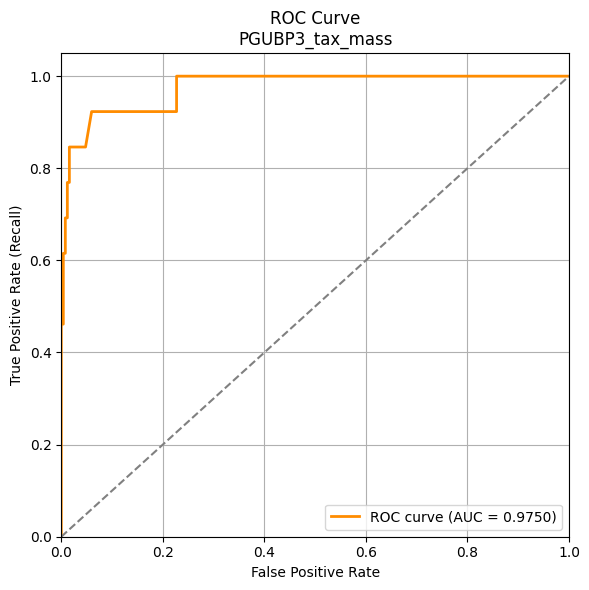

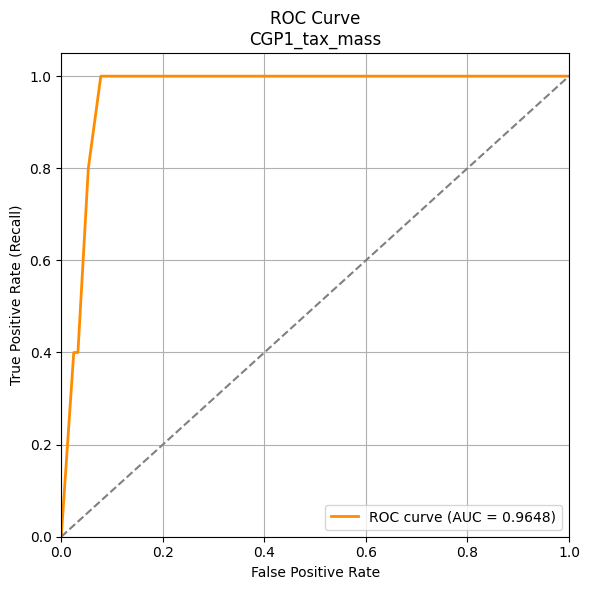

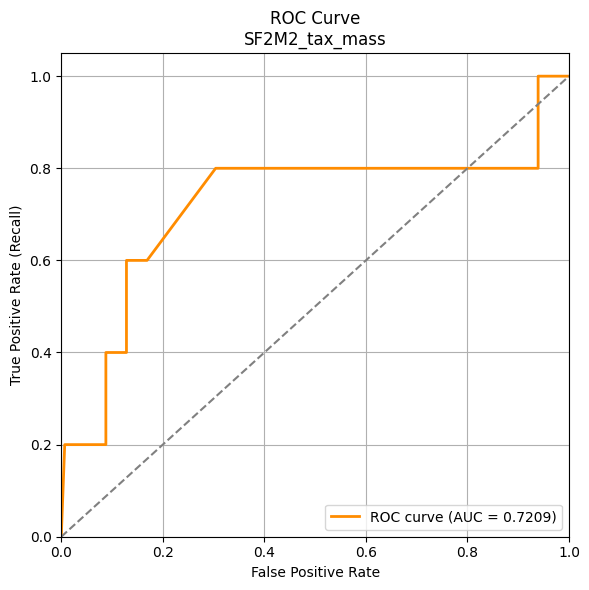

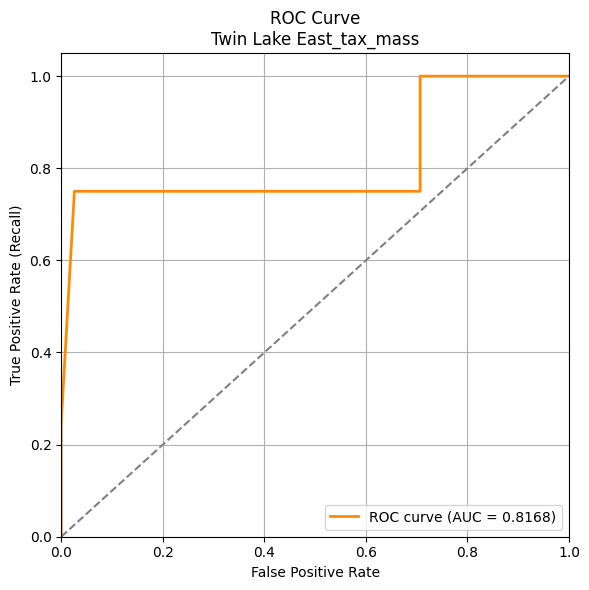

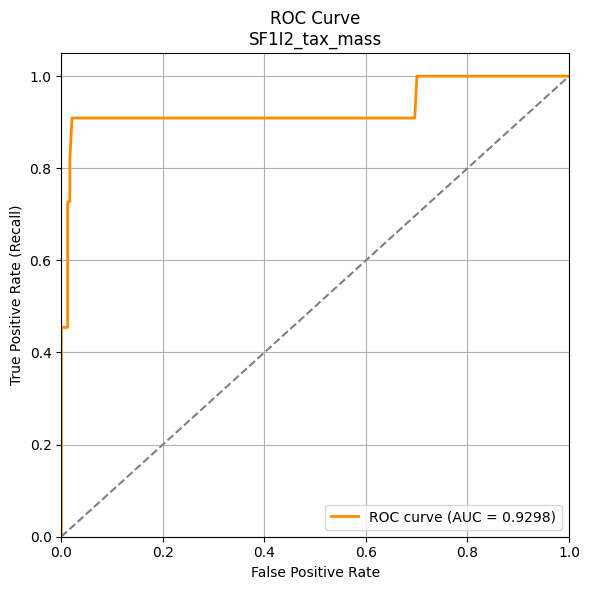

...

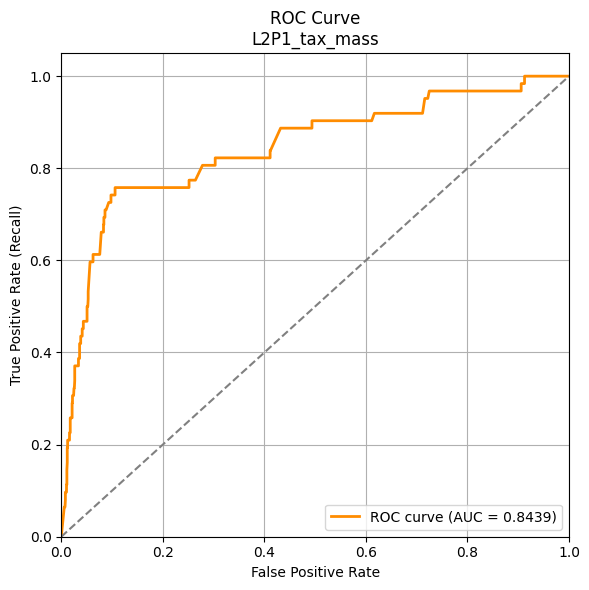

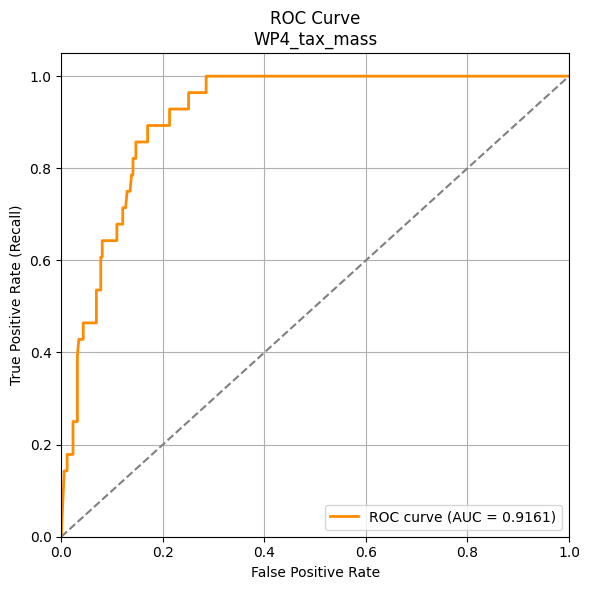

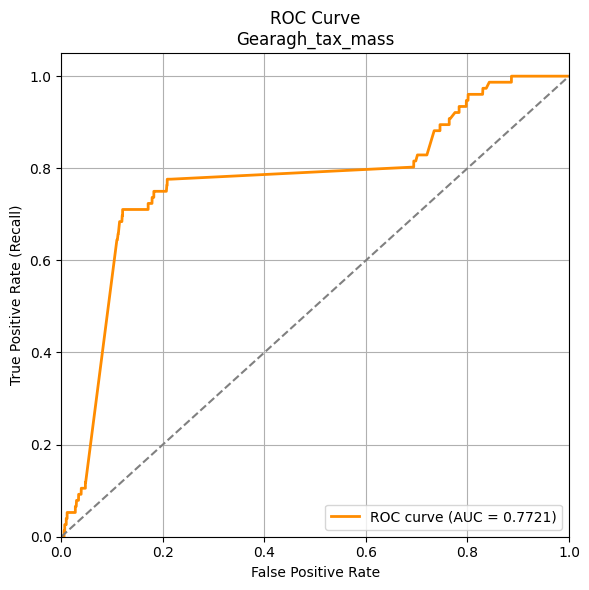

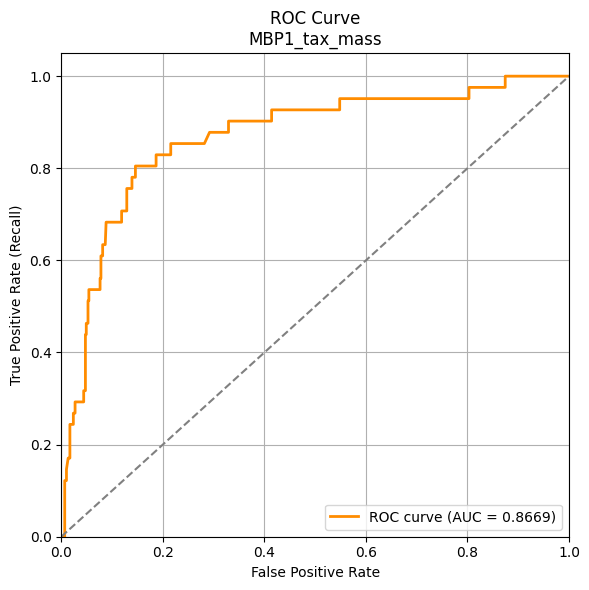

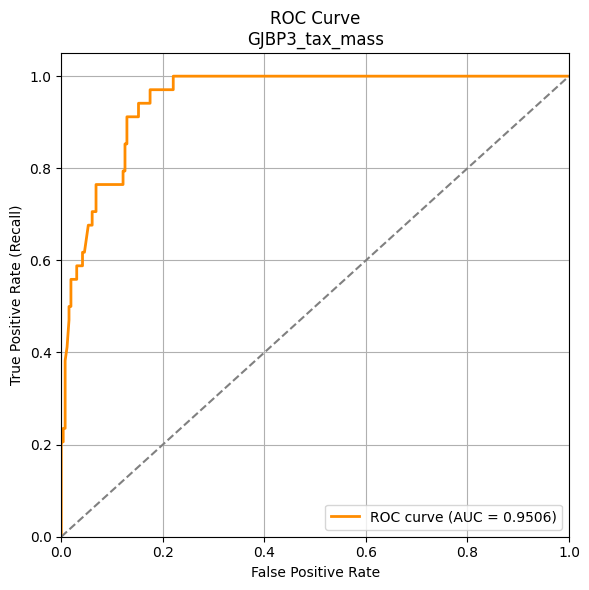

Skipping German Creek_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/German Creek_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Ythan Estuary_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Fawn lake_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Fawn lake_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping Chilean Intertidal El Quisco_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv/Chilean Intertidal El Quisco_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-true.csv'
Skipping SEW01_tax_mass due to e

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import os

# === Load list of food webs ===
foodwebs_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base path to your score/label files ===
base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv"

# === Loop over each food web ===
for foodweb in foodwebs_df["Foodweb"]:
    file_path = os.path.join(base_path, f"{foodweb}_K_10_scores_labels_evaluate_on_all_unseen-true.csv")

    try:
        df = pd.read_csv(file_path)
        y_true = df['Label']
        y_score = df['Score']

        # Compute ROC and AUC
        fpr, tpr, thresholds = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve
        plt.figure(figsize=(6, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (AUC = {roc_auc:.4f})")
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # chance line
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate (Recall)')
        plt.title(f'ROC Curve\n{foodweb}')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")

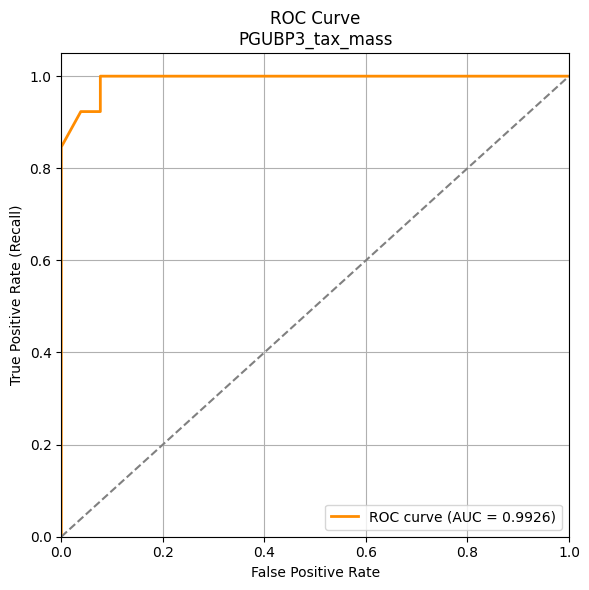

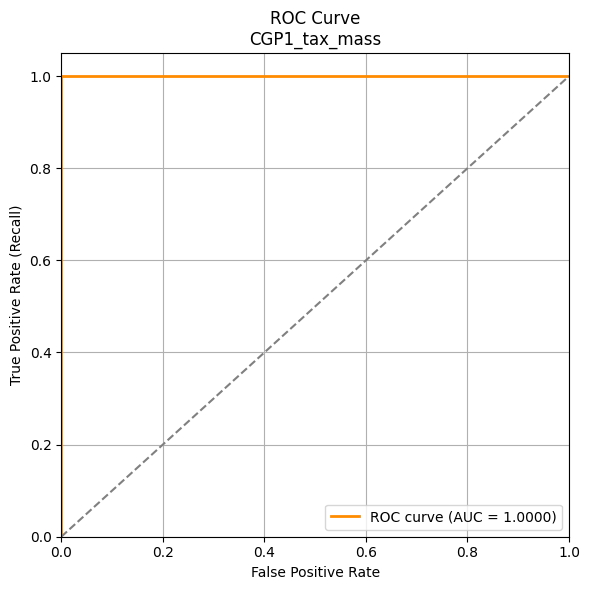

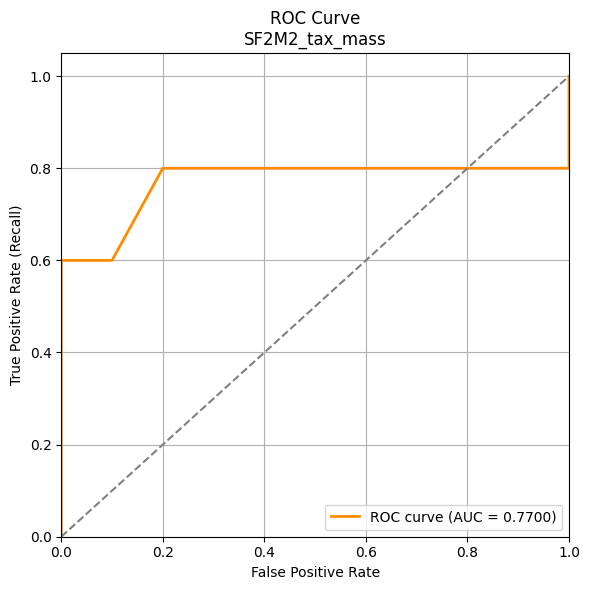

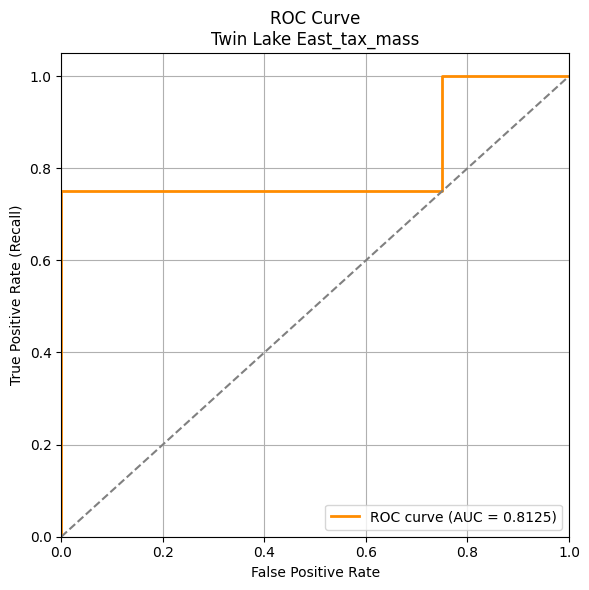

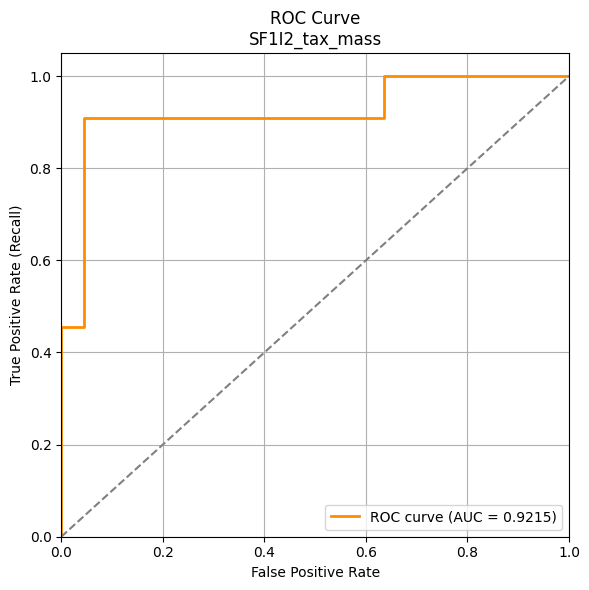

...

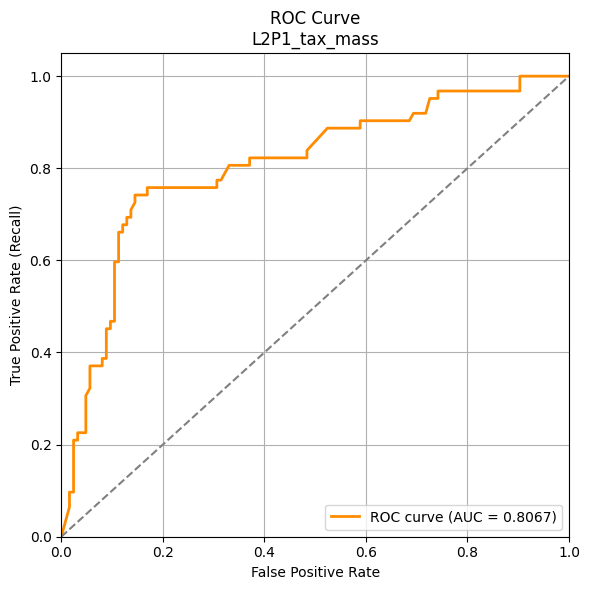

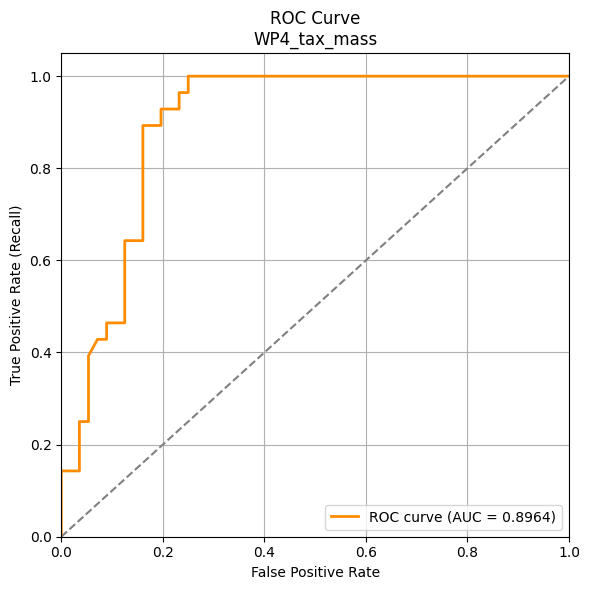

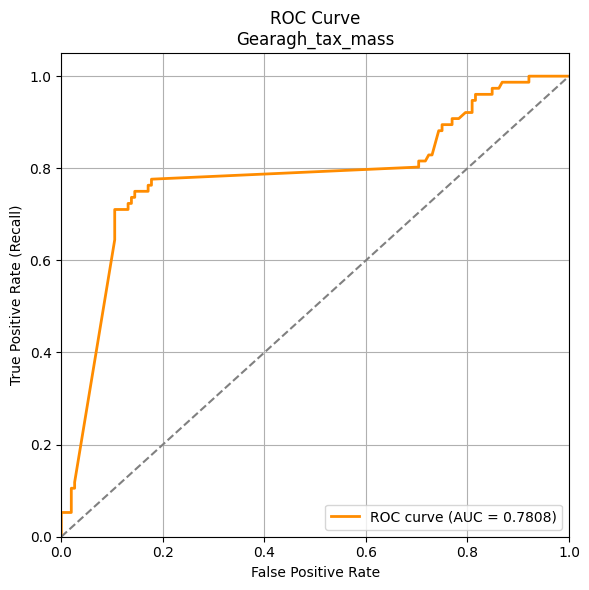

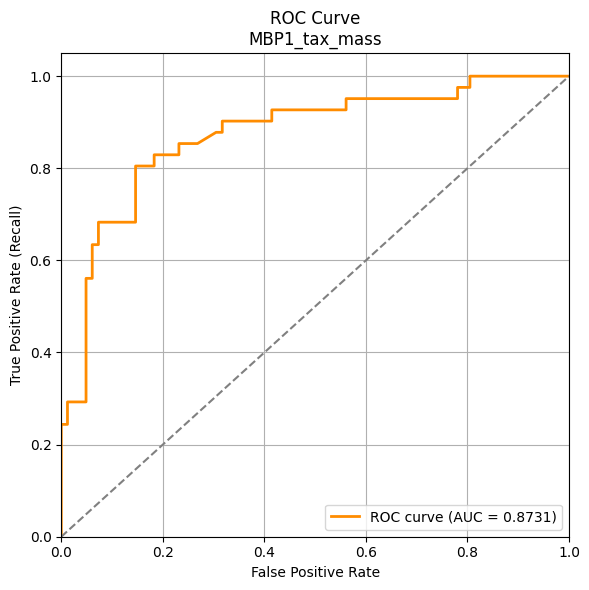

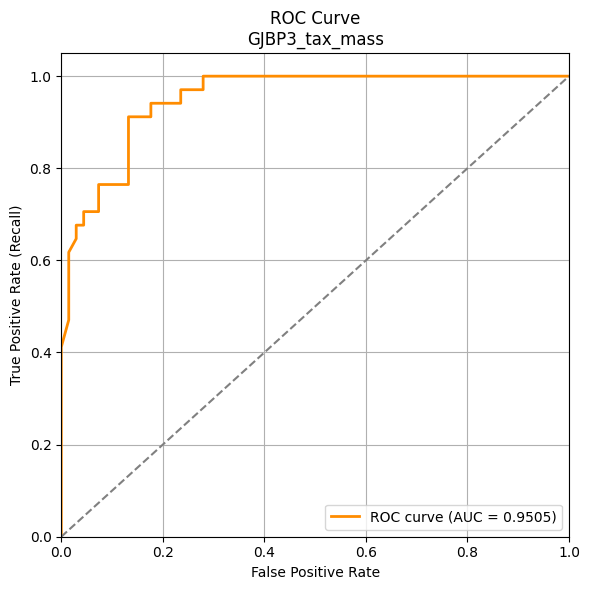

Skipping German Creek_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/German Creek_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Ythan Estuary_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Ythan Estuary_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Fawn lake_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Fawn lake_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping Chilean Intertidal El Quisco_tax_mass due to error: [Errno 2] No such file or directory: '../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv/Chilean Intertidal El Quisco_tax_mass_K_10_scores_labels_evaluate_on_all_unseen-false.csv'
Skipping SEW01_tax_mass 

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import os

# === Load list of food webs ===
foodwebs_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base path to your score/label files ===
base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv"

# === Loop over each food web ===
for foodweb in foodwebs_df["Foodweb"]:
    file_path = os.path.join(base_path, f"{foodweb}_K_10_scores_labels_evaluate_on_all_unseen-false.csv")

    try:
        df = pd.read_csv(file_path)
        y_true = df['Label']
        y_score = df['Score']

        # Compute ROC and AUC
        fpr, tpr, thresholds = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve
        plt.figure(figsize=(6, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (AUC = {roc_auc:.4f})")
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # chance line
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate (Recall)')
        plt.title(f'ROC Curve\n{foodweb}')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")
